In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
import collections
from typing import List, Optional, Tuple

from matplotlib import rcParams
import matplotlib.lines as mlines
import matplotlib.markers as mmarkers
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.special
import scipy.stats
import seaborn as sns
import sys

from src import evaluation, utils_plot


pd.set_option('display.max_colwidth', None)

rcParams['pdf.fonttype'] = 42
rcParams['ps.fonttype'] = 42
rcParams['font.family'] = 'serif'
rcParams['font.sans-serif'] = ['Palatio']
rcParams['text.usetex'] = True
rcParams['text.latex.preamble'] = r'\usepackage{amsfonts}'

%load_ext autoreload
%autoreload 2

2023-10-26 14:08:31.043018: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-10-26 14:08:31.493790: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [3]:
DATASET = 'imagenet-a'
results_dfs = utils_plot.read_and_prepare_stats_dfs(DATASET)

results_dfs['all'].columns

Index(['model_dir_id', 'num_params', 'training_data', 'training_data_group',
       'training_data_size', 'arch', 'arch_family', 'arch_group',
       'extra_annotations', 'pretrain_method', 'top1_val_acc',
       'top1_val_acc_subset_200', 'imagenet_top1_val_acc',
       'imagenet_mla_val_acc', 'num_all_samples', 'num_group_samples',
       'num_group_correct', 'num_all_top1_errors', 'num_group_top1_errors',
       'mla_all', 'mla_all_minor_error', 'mla_all_explainable_error',
       'mla_group', 'mla_group_minor_error', 'mla_group_explainable_error',
       'num_collapsed_mappings', 'num_ambiguous', 'num_same_superclass',
       'num_common_co_occ', 'num_non_prototypical', 'num_OOV_clip',
       'num_not_classified'],
      dtype='object')

In [4]:
results_dfs['all']['training_data'].value_counts()

training_data
ImageNet-1k (1.2M)           757
ImageNet-21k (14M)           131
LAION-2B (2.3B)               23
Instagram (940M)              10
JFT (300M)                    10
WIT (400M)                     9
Flickr YFCC (90M)              6
Instagram (3.6B)               6
RandomInternetImages (2B)      4
Merged (38M)                   2
LAION-400M (400M)              2
Merged (30M)                   2
Name: count, dtype: int64

In [5]:
results_dfs['all']['arch_group'].value_counts()

arch_group
ResNet          196
ViT             180
EfficientNet    141
CNN              96
RegNet           61
ConvNeXt         55
Hybrid           46
MetaFormer       42
XCiT             42
MaxViT           35
Swin             29
EVA              16
MLP              14
BEIT              9
Name: count, dtype: int64

In [6]:
results_dfs['artifact']

,model_dir_id,num_params,training_data,training_data_group,training_data_size,arch,arch_family,arch_group,extra_annotations,pretrain_method,...,mla_group,mla_group_minor_error,mla_group_explainable_error,num_collapsed_mappings,num_ambiguous,num_same_superclass,num_common_co_occ,num_non_prototypical,num_OOV_clip,num_not_classified
0,facebook--convnext-base-224,88591464,ImageNet-1k (1.2M),small (< 5M),1.200000e+06,convnext,cnn,ConvNeXt,[],Standard,...,13.865186,37.029152,39.008573,0,0,158,54,0,374,1371
1,facebook--convnext-base-224-22k-1k,88591464,ImageNet-21k (14M),medium (< 50M),1.400000e+07,convnext,cnn,ConvNeXt,[],Standard,...,24.681063,50.678589,53.115439,0,0,172,64,0,416,1073
2,facebook--convnext-base-384,88591464,ImageNet-1k (1.2M),small (< 5M),1.200000e+06,convnext,cnn,ConvNeXt,[],Standard,...,25.437508,47.436649,49.674813,0,0,154,57,0,357,1158
3,facebook--convnext-base-384-22k-1k,88591464,ImageNet-21k (14M),medium (< 50M),1.400000e+07,convnext,cnn,ConvNeXt,[],Standard,...,37.914671,59.868728,61.908325,0,0,155,54,0,334,894
4,facebook--convnext-large-224,197767336,ImageNet-1k (1.2M),small (< 5M),1.200000e+06,convnext,cnn,ConvNeXt,[],Standard,...,15.718108,39.318035,41.403024,0,0,160,51,0,378,1321
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
957,torchvision--vit_l_16,304326632,ImageNet-1k (1.2M),small (< 5M),1.200000e+06,vit,transformer,ViT,[],Standard,...,6.704367,28.841458,30.210383,0,0,134,31,0,368,1567
958,torchvision--vit_l_16_swag,305174504,Instagram (3.6B),xlarge (> 500M),3.600000e+09,vit,transformer,ViT,['Semi-Supervised Learning'],Semi-Supervised Learning,...,50.509051,71.709821,73.876711,0,0,143,56,0,321,645
959,torchvision--vit_l_32,306535400,ImageNet-1k (1.2M),small (< 5M),1.200000e+06,vit,transformer,ViT,[],Standard,...,4.764790,25.316419,26.392900,0,0,119,29,0,340,1657
960,torchvision--wide_resnet101_2,126886696,ImageNet-1k (1.2M),small (< 5M),1.200000e+06,wide_resnet,cnn,ResNet,[],Standard,...,9.769964,32.449142,34.957972,0,0,134,55,0,378,1465


# ImageNet vs ImageNet-A accuracies

=== PER GROUP ===
Max ys: [74.78, 61.34]
Min ys: [0.15, 0.22]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_top1_val_acc_y_axis=num_group_correct_relative_to_num_group_samples_marker=training_data_group_color=num_params_groups=organism_artifact


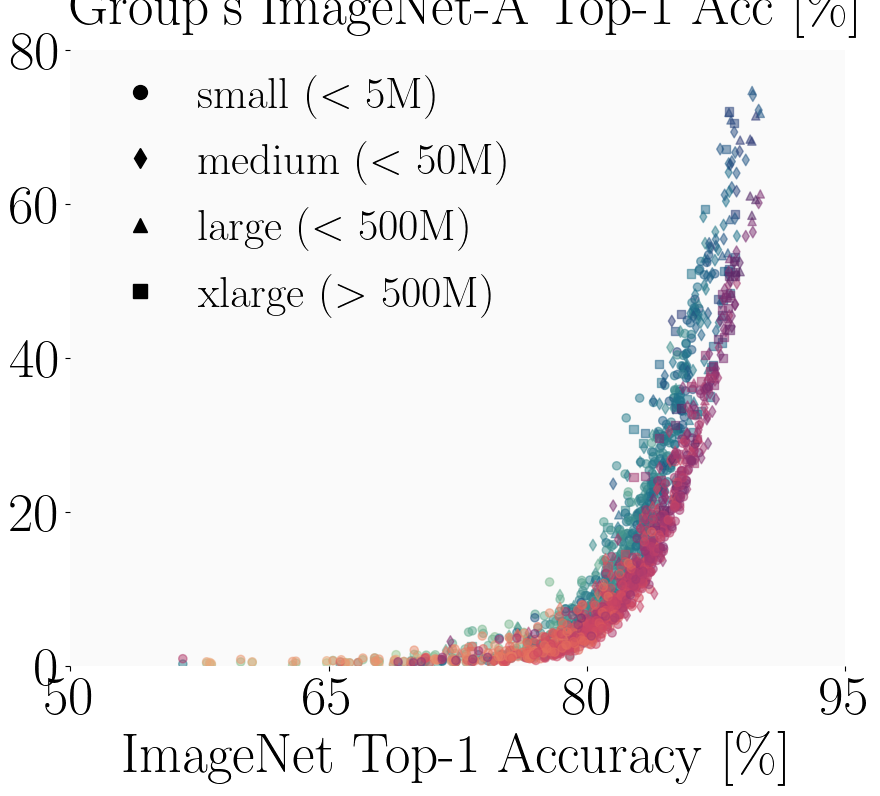

Max ys: [74.78, 61.34, 50.21]
Min ys: [0.15, 0.22, 0.0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_top1_val_acc_y_axis=num_group_correct_relative_to_num_group_samples_marker=training_data_group_color=num_params_groups=organism_artifact_other


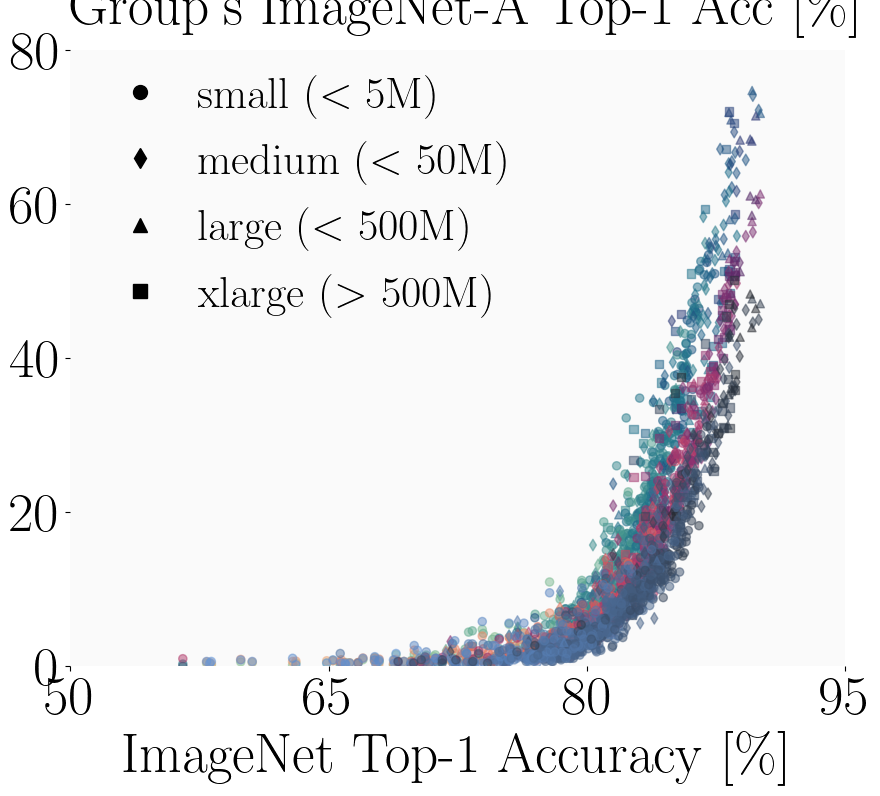

=== ALL ===
Max ys: [67.96]
Min ys: [0.24]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_top1_val_acc_y_axis=num_group_correct_relative_to_num_group_samples_marker=training_data_group_color=num_params_groups=all


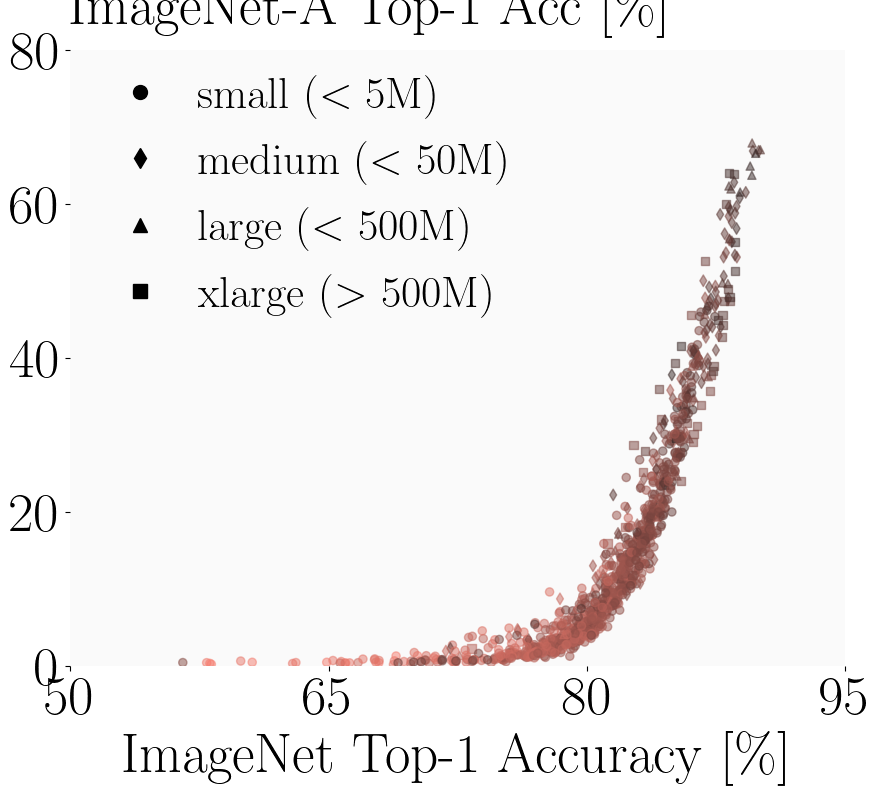

In [27]:
utils_plot.plot_imagenet_a_vs_imagenet_top1_acc(results_dfs, marker_column='training_data_group', color_column='num_params')

=== PER GROUP ===
Max ys: [74.78, 61.34]
Min ys: [0.15, 0.22]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_group_correct_relative_to_num_group_samples_marker=arch_family_color=training_data_size_groups=organism_artifact


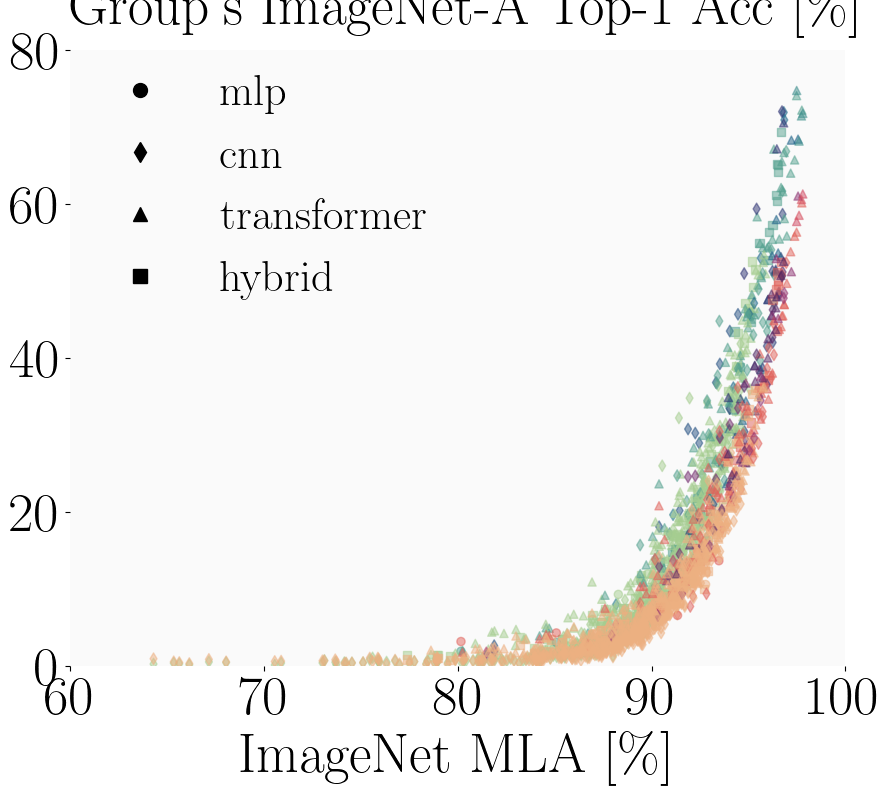

Max ys: [74.78, 61.34, 50.21]
Min ys: [0.15, 0.22, 0.0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_group_correct_relative_to_num_group_samples_marker=arch_family_color=training_data_size_groups=organism_artifact_other


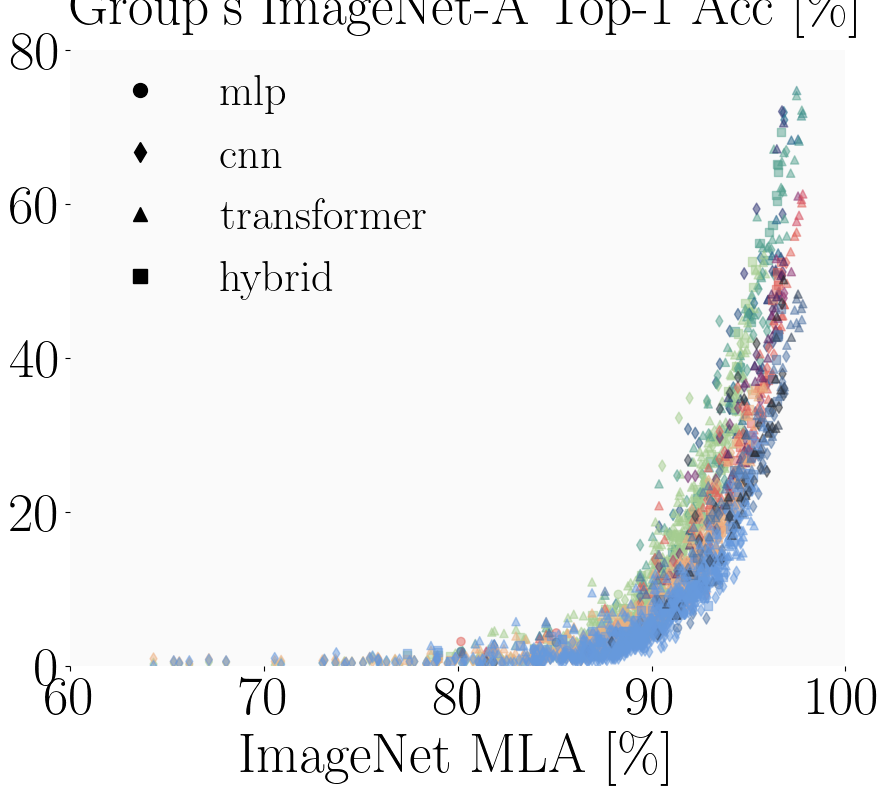

=== ALL ===
Max ys: [67.96]
Min ys: [0.24]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_group_correct_relative_to_num_group_samples_marker=arch_family_color=training_data_size_groups=all


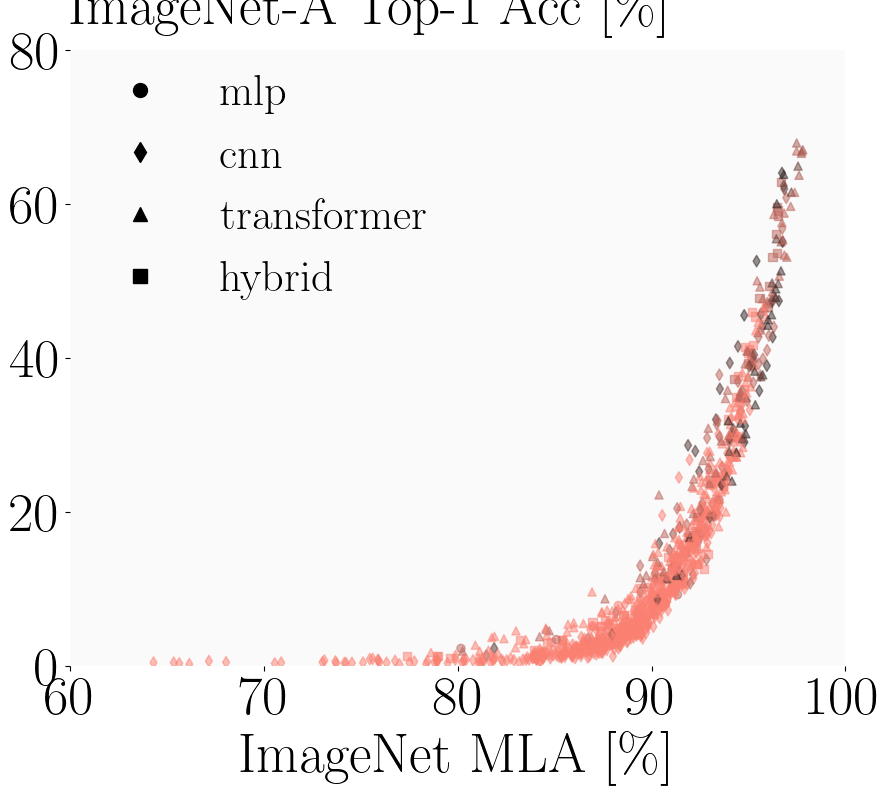

In [8]:
utils_plot.plot_imagenet_a_vs_imagenet_mla_acc(results_dfs)

# ===============

# Class Overlap (Collapsed Mappings)

=== PER GROUP ===
Max ys: [1.58, 0.0]
Min ys: [0.0, 0.0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_collapsed_mappings_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact


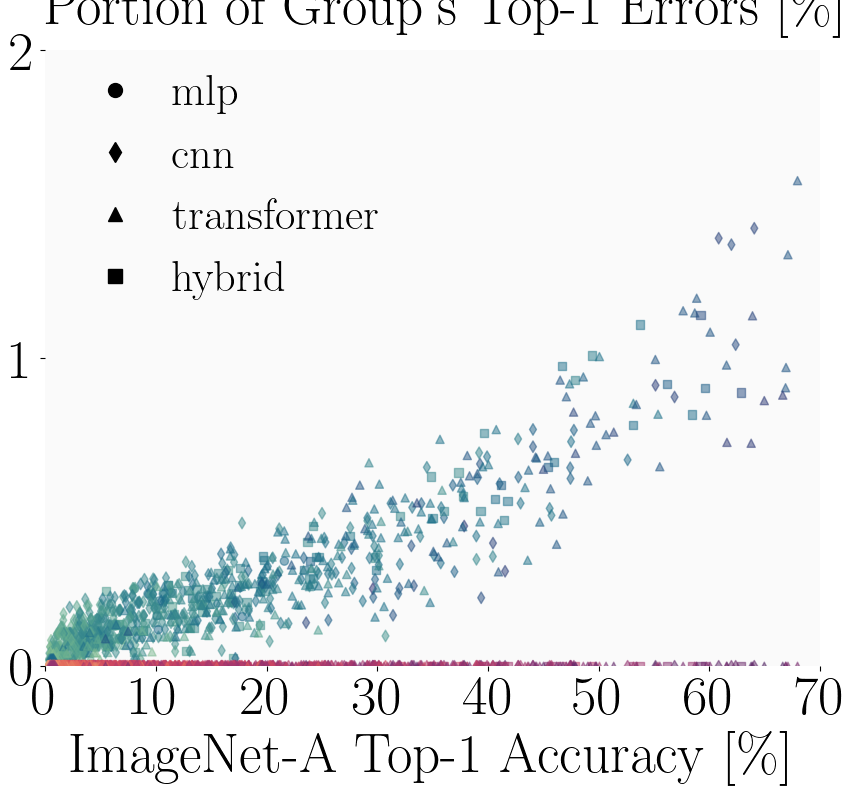

Max ys: [22, 0]
Min ys: [0, 0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_collapsed_mappings_abs_marker=arch_family_color=num_params_groups=organism_artifact


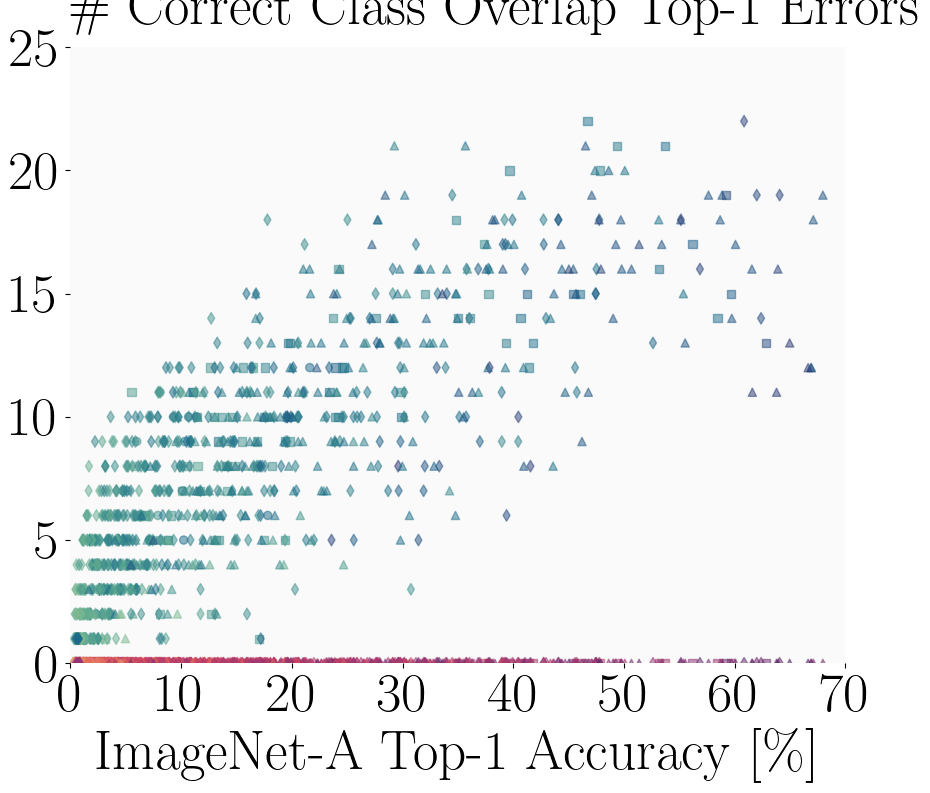

Max ys: [1.58, 0.0, 0.0]
Min ys: [0.0, 0.0, 0.0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_collapsed_mappings_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact_other


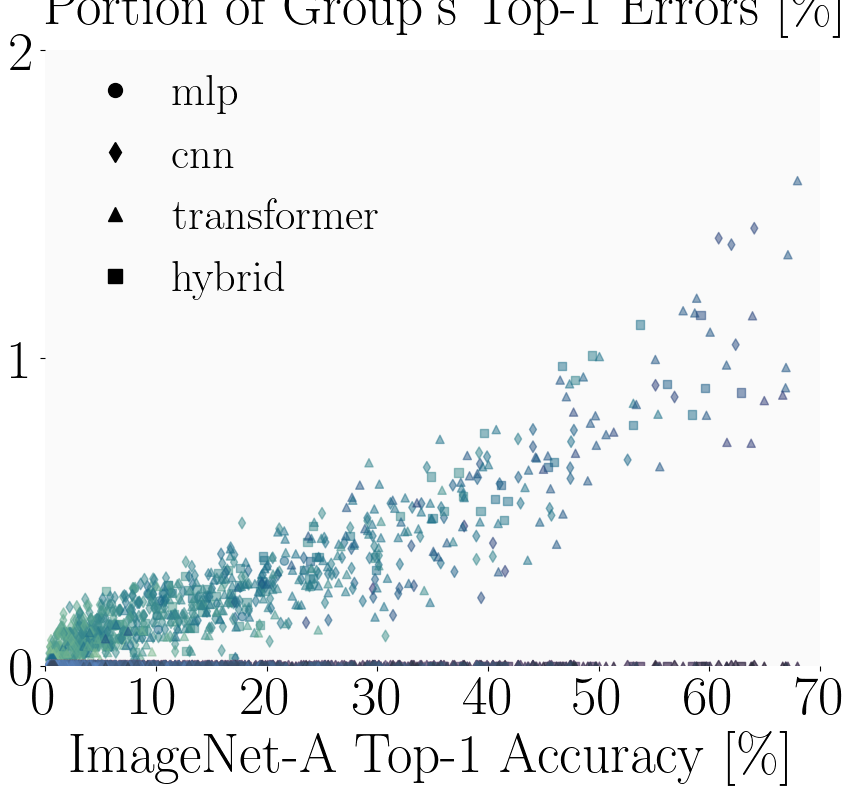

Max ys: [22, 0, 0]
Min ys: [0, 0, 0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_collapsed_mappings_abs_marker=arch_family_color=num_params_groups=organism_artifact_other


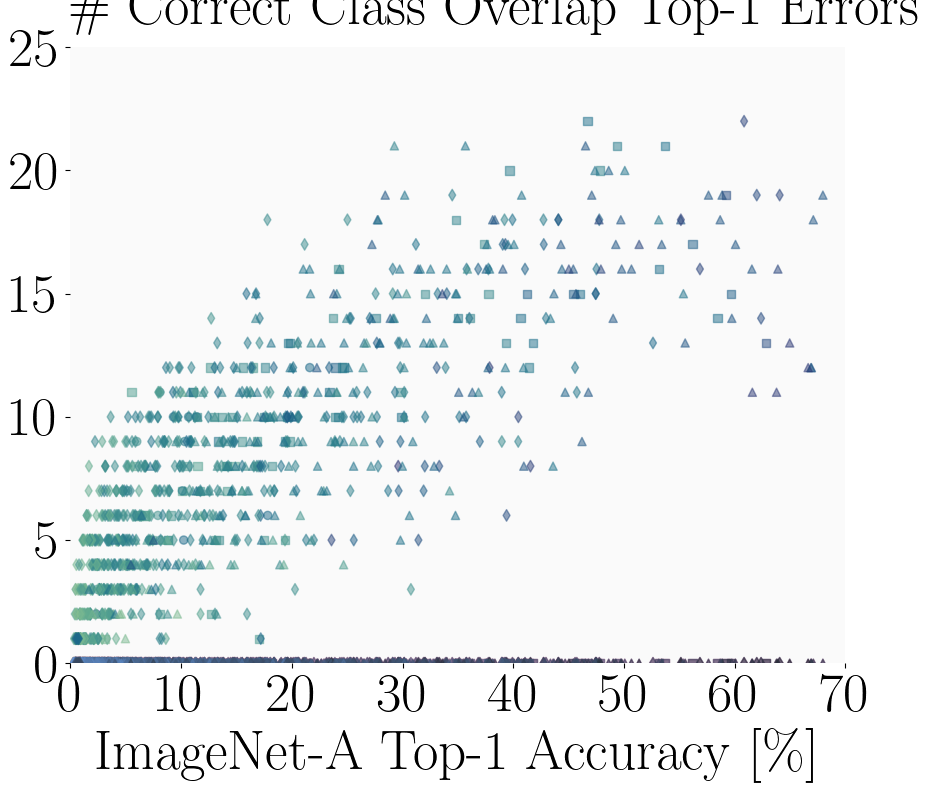

Max ys: [1.58]
Min ys: [0.0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_collapsed_mappings_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism


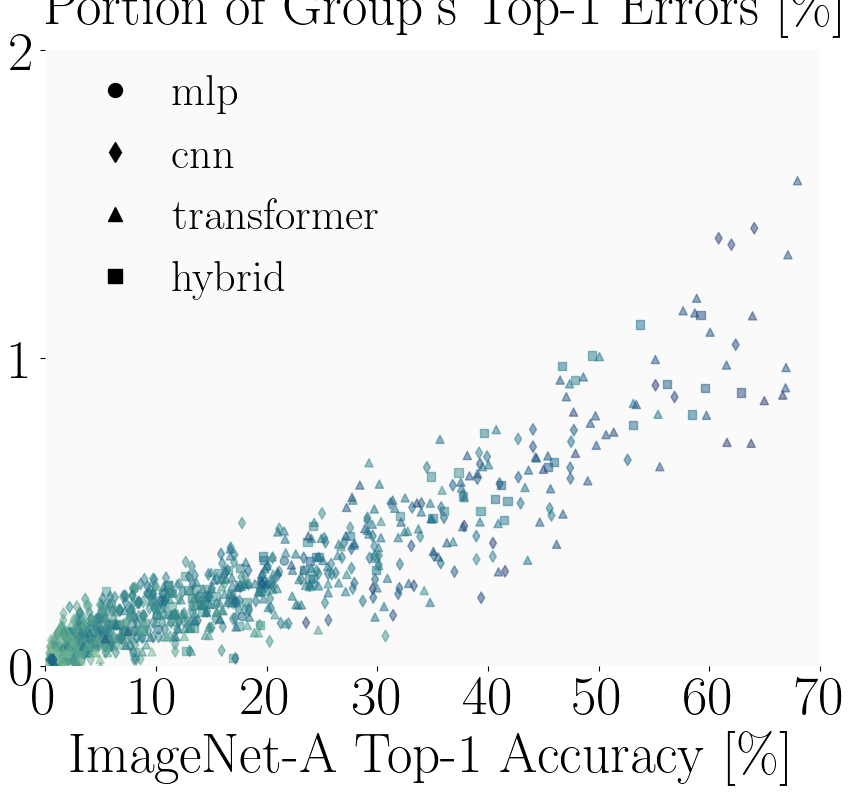

Max ys: [22]
Min ys: [0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_collapsed_mappings_abs_marker=arch_family_color=num_params_groups=organism


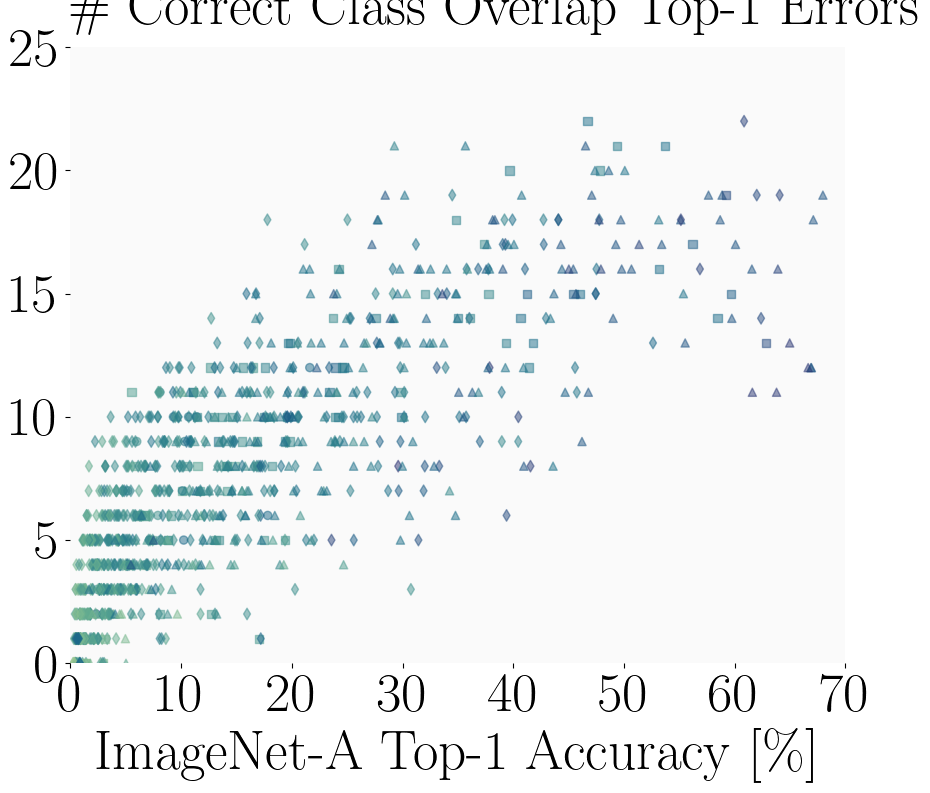

=== ALL ===
Max ys: [0.79]
Min ys: [0.0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_collapsed_mappings_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=all


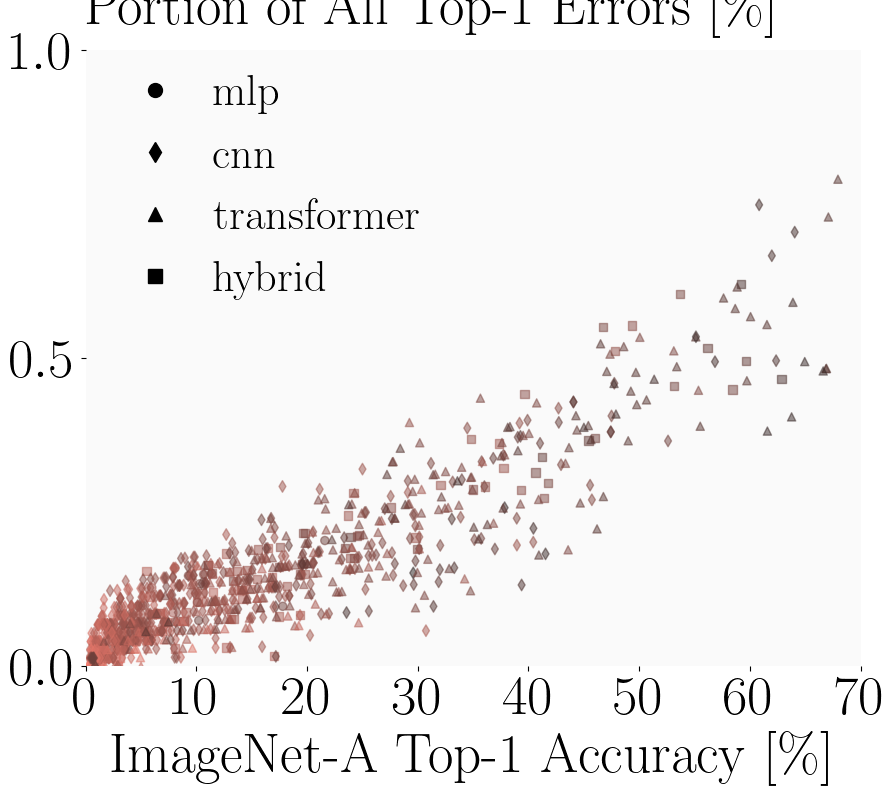

Max ys: [22]
Min ys: [0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_collapsed_mappings_abs_marker=arch_family_color=num_params_groups=all


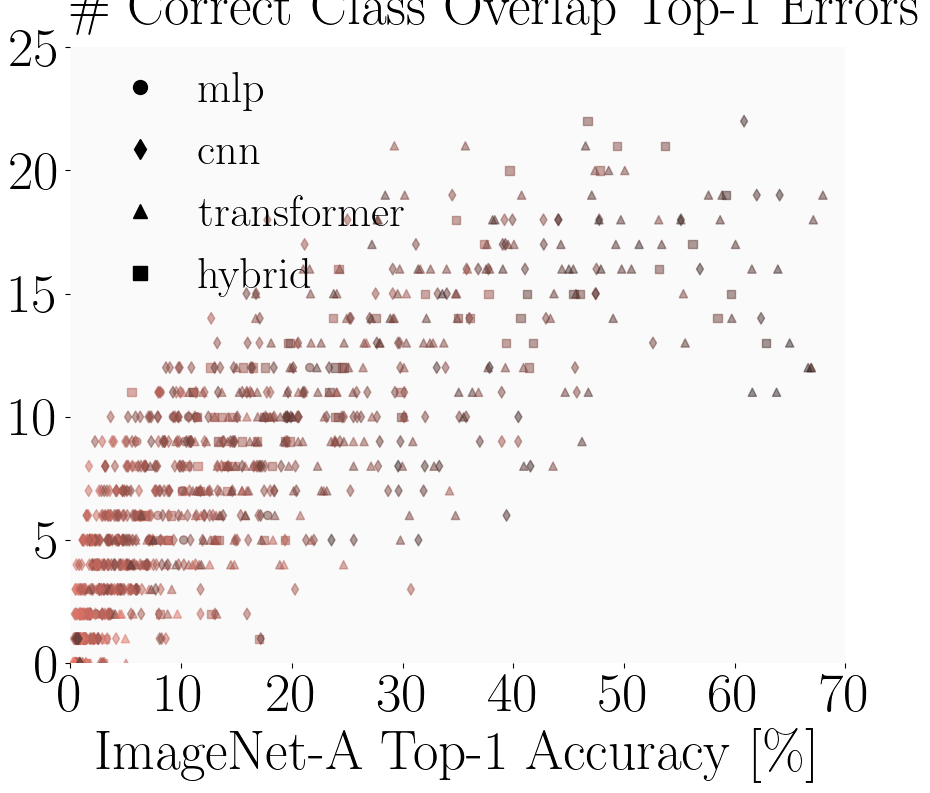

In [28]:
utils_plot.plot_class_overlap_imagenet_a(results_dfs, color_column='num_params')

# ===============

# Fine-Grained Errors

=== PER GROUP ===
Max ys: [46.39, 14.24]
Min ys: [4.57, 4.0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_same_superclass_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact


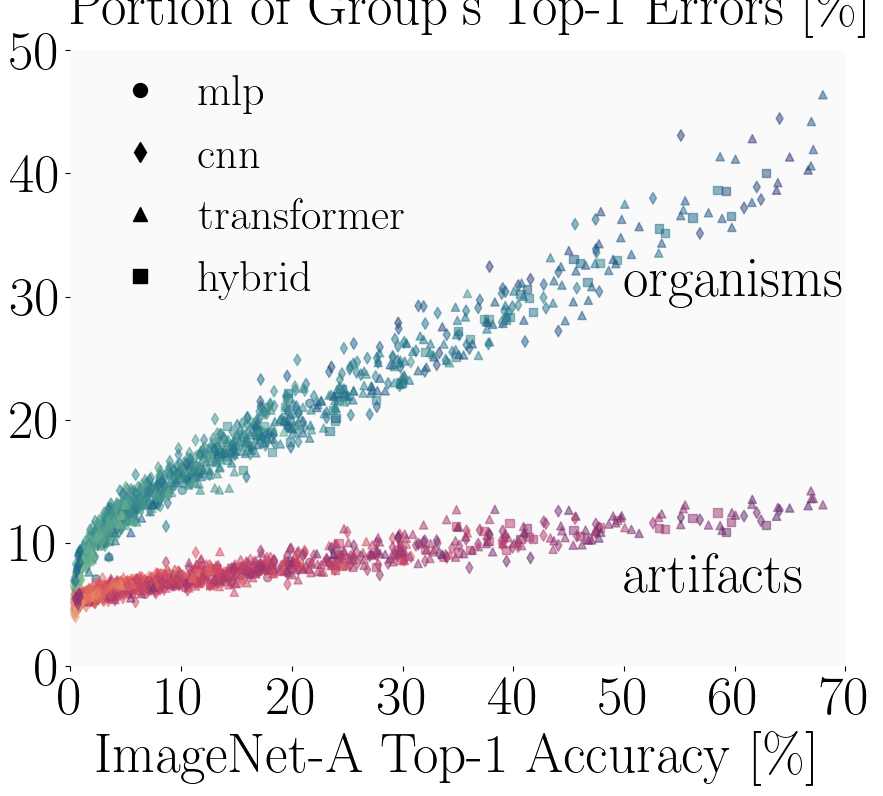

Max ys: [905, 186]
Min ys: [218, 89]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_same_superclass_abs_marker=arch_family_color=num_params_groups=organism_artifact


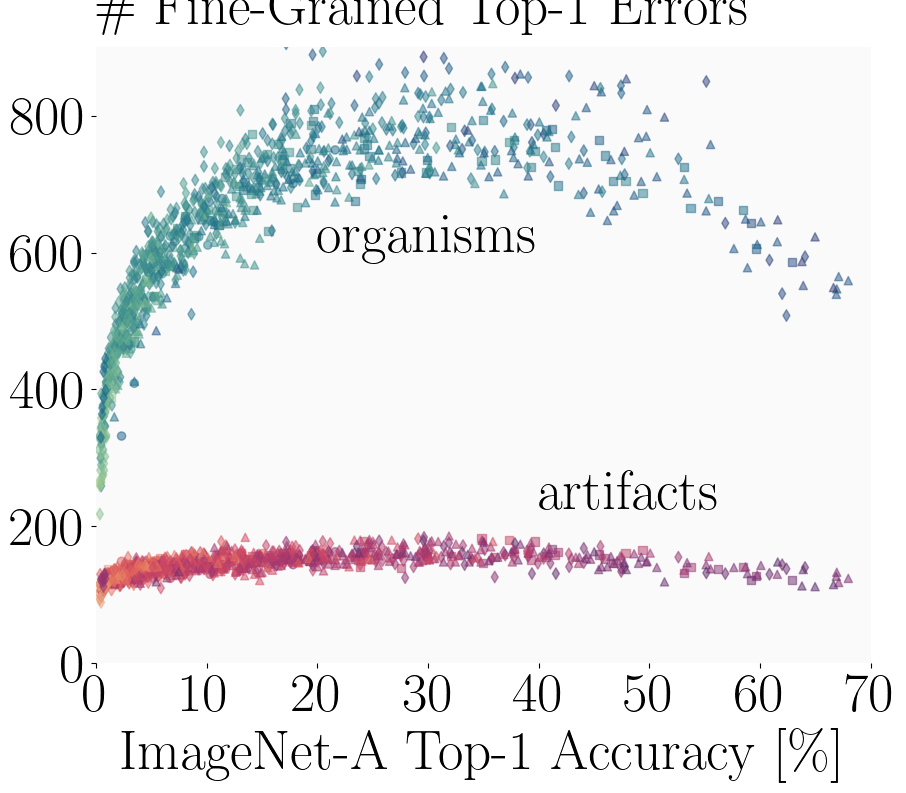

Max ys: [46.39, 14.24, 22.52]
Min ys: [4.57, 4.0, 2.92]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_same_superclass_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact_other


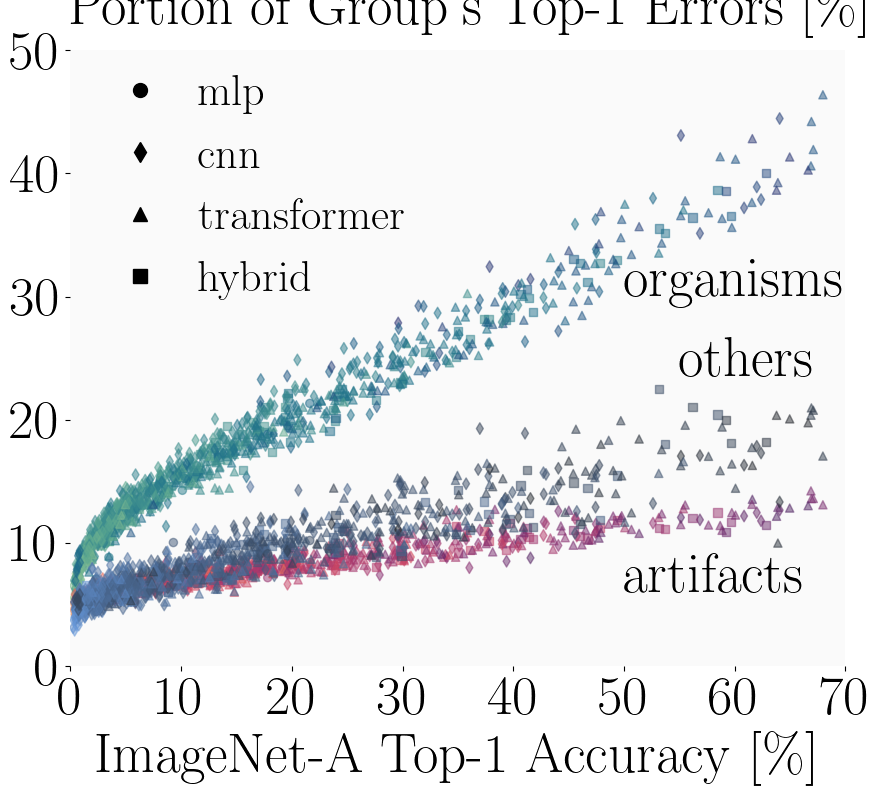

Max ys: [905, 186, 71]
Min ys: [218, 89, 14]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_same_superclass_abs_marker=arch_family_color=num_params_groups=organism_artifact_other


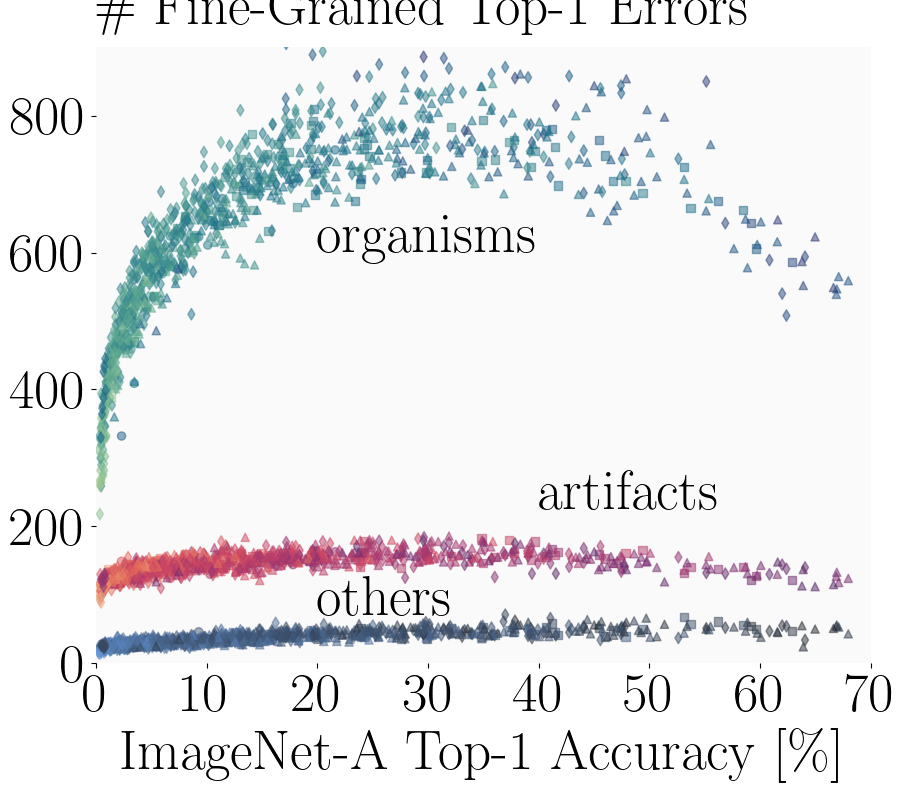

=== ALL ===
Max ys: [30.86]
Min ys: [4.42]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_same_superclass_relative_to_group_mle_marker=arch_family_color=num_params_groups=all


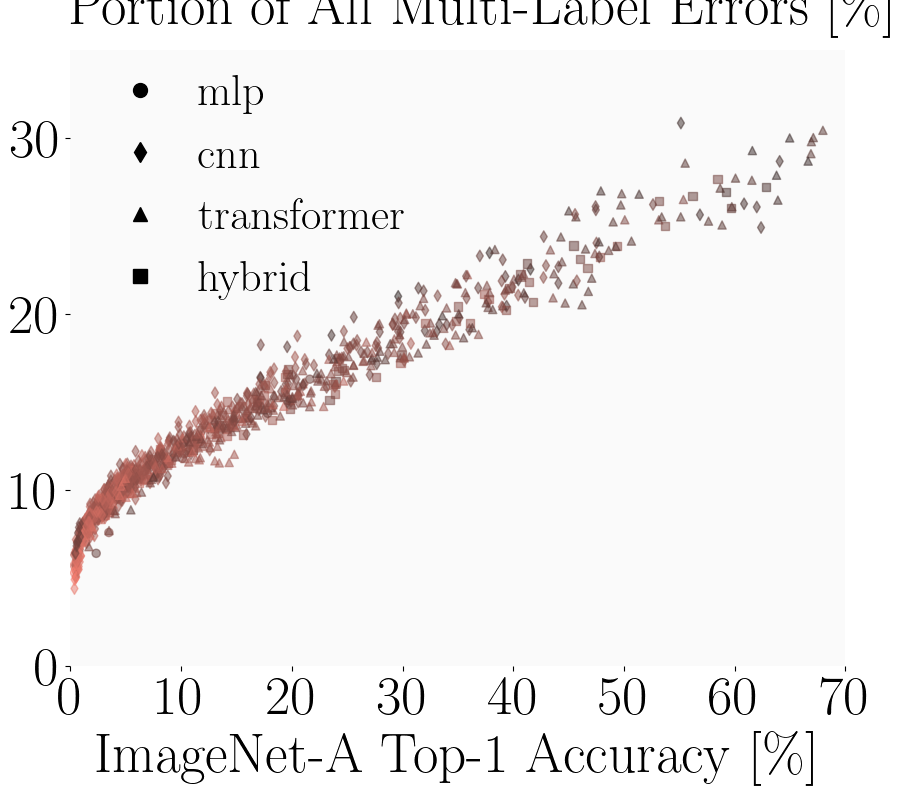

Max ys: [1134]
Min ys: [330]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_same_superclass_abs_marker=arch_family_color=num_params_groups=all


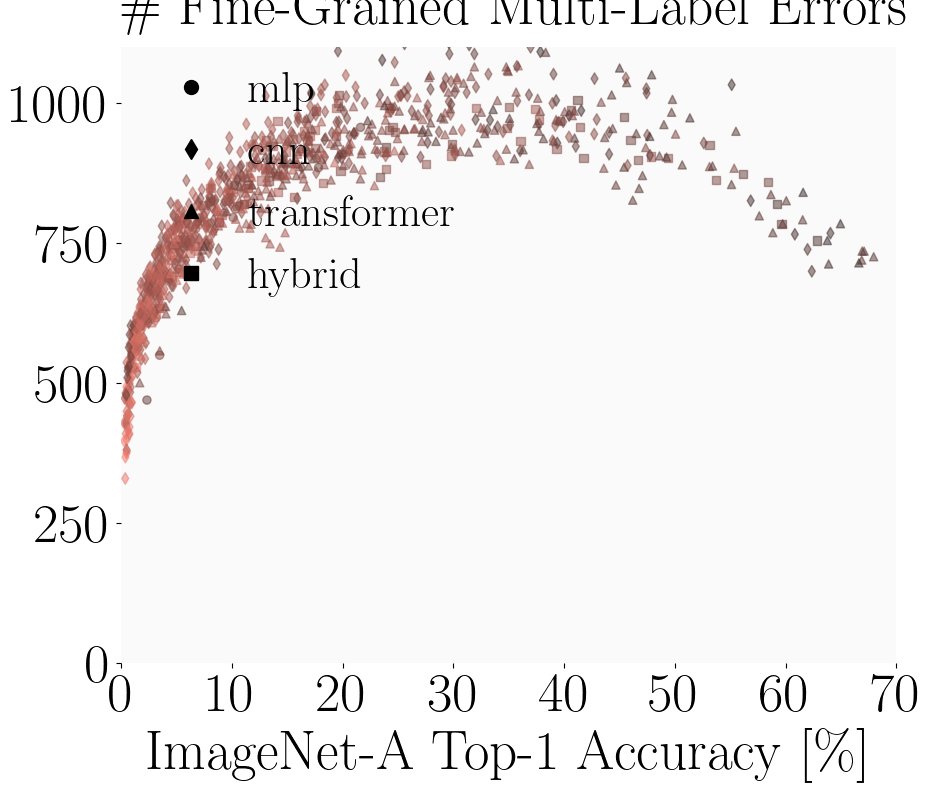

In [29]:
utils_plot.plot_fine_grained_imagenet_a(results_dfs, color_column='num_params')

# ===============

# Fine-Grained OOV Errors

=== PER GROUP ===
Max ys: [12.51, 29.37]
Min ys: [3.88, 11.41]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_OOV_clip_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact


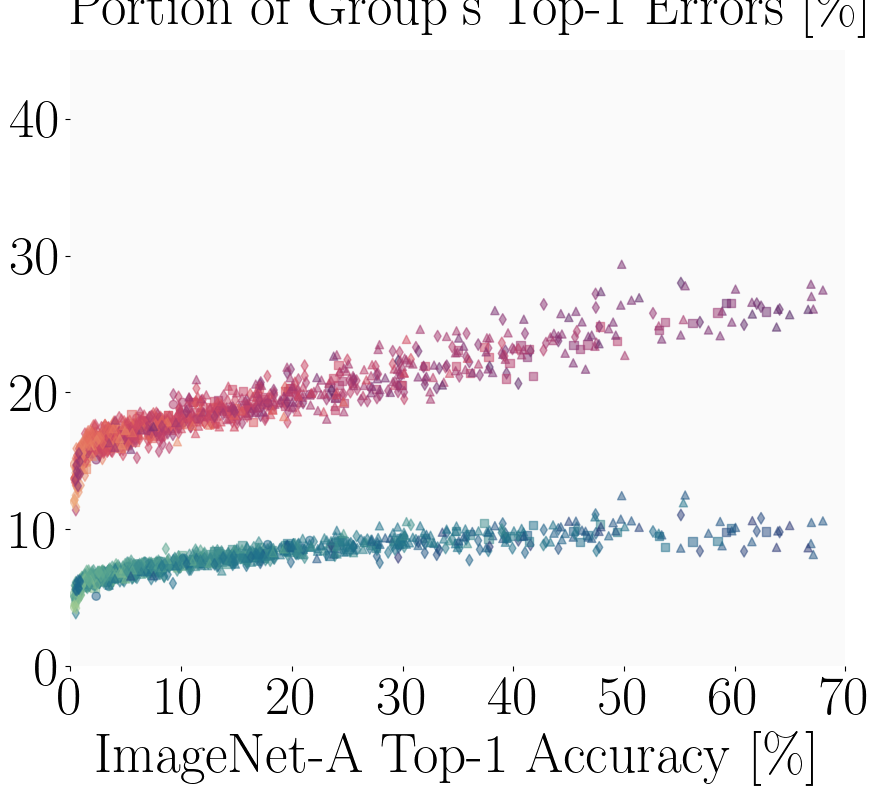

Max ys: [369, 420]
Min ys: [110, 224]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_OOV_clip_abs_marker=arch_family_color=num_params_groups=organism_artifact


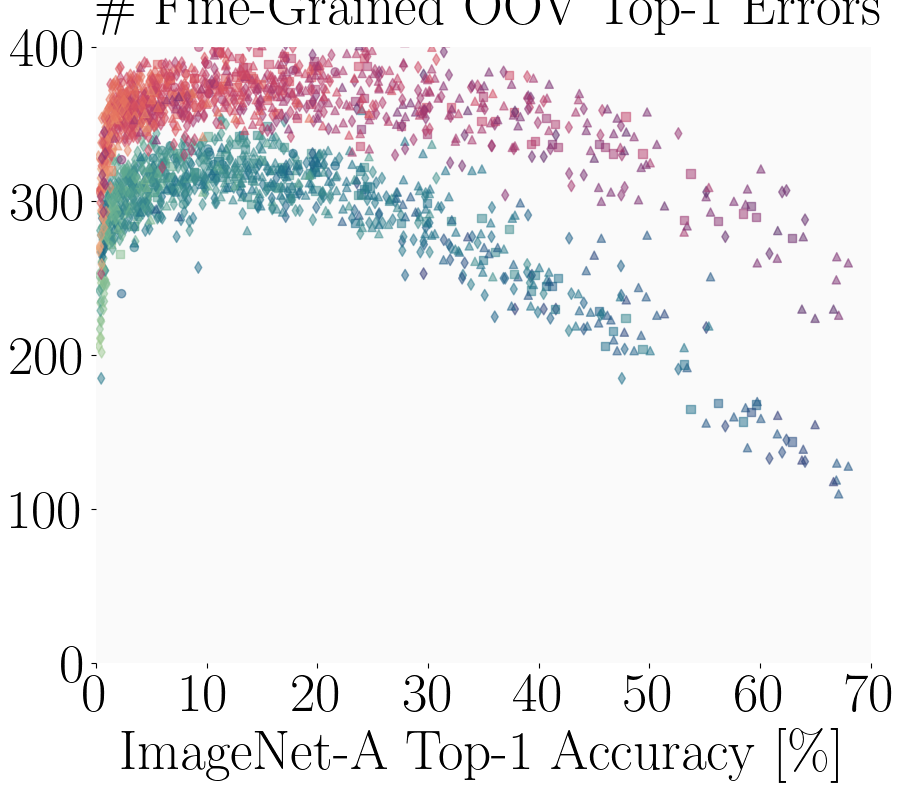

Max ys: [12.51, 29.37, 43.02]
Min ys: [3.88, 11.41, 20.21]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_OOV_clip_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact_other


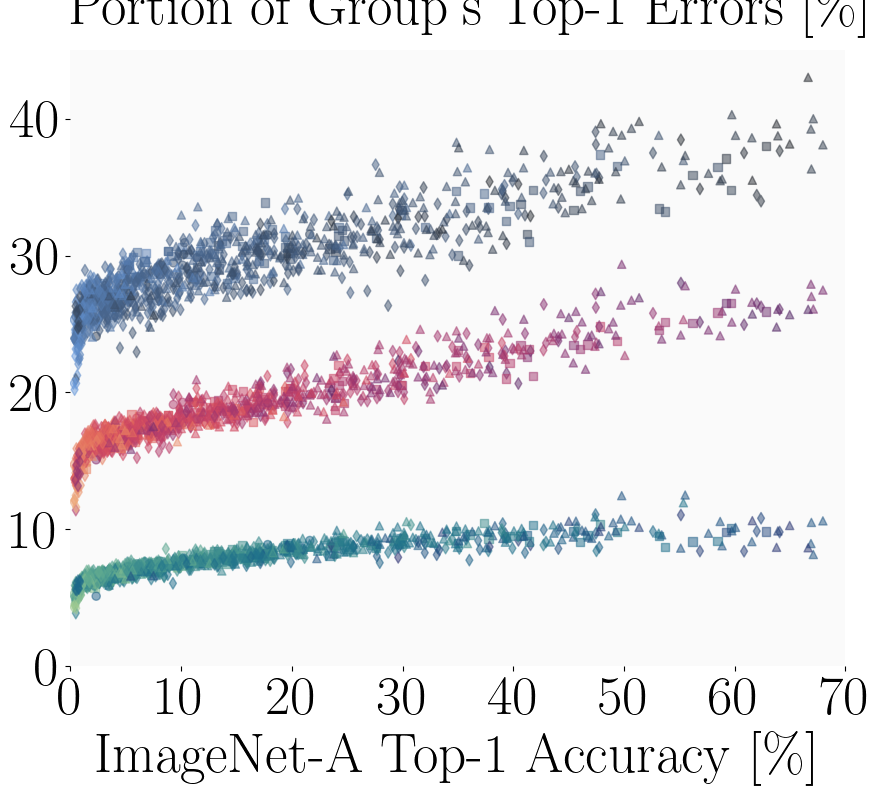

Max ys: [369, 420, 149]
Min ys: [110, 224, 93]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_OOV_clip_abs_marker=arch_family_color=num_params_groups=organism_artifact_other


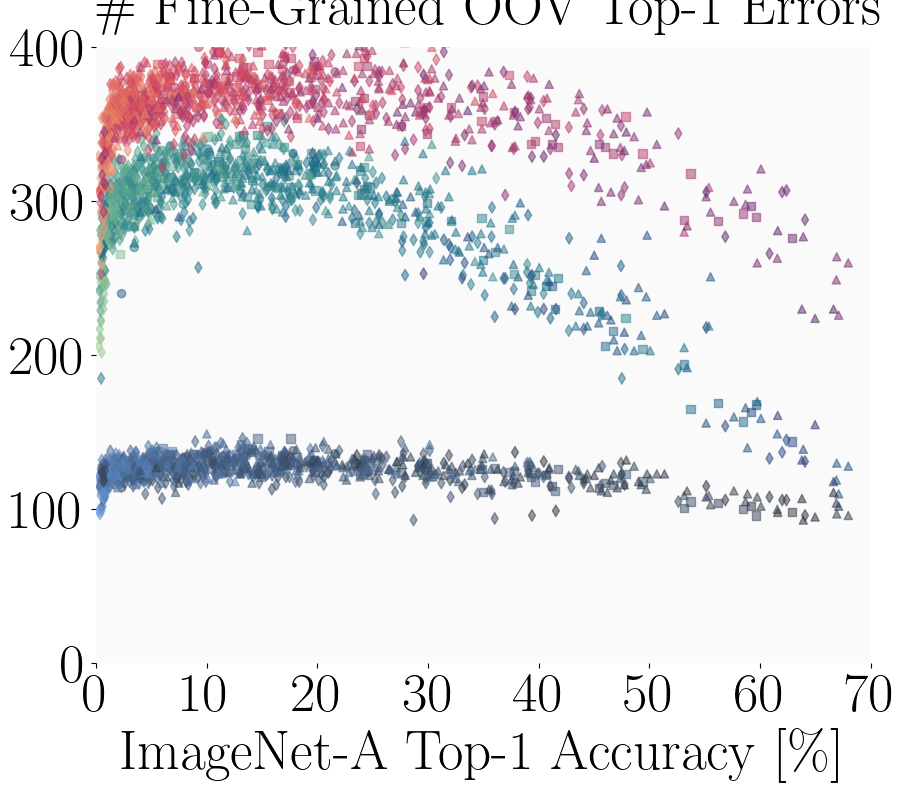

=== ALL ===
Max ys: [20.3]
Min ys: [7.22]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_OOV_clip_relative_to_group_mle_marker=arch_family_color=num_params_groups=all


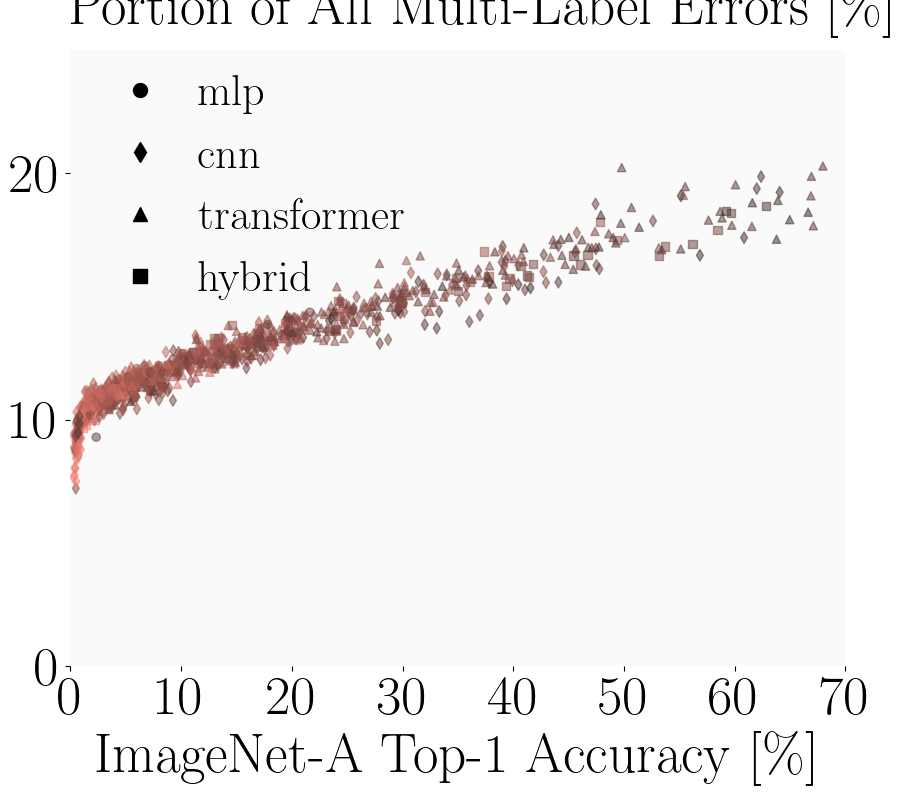

Max ys: [892]
Min ys: [438]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_OOV_clip_abs_marker=arch_family_color=num_params_groups=all


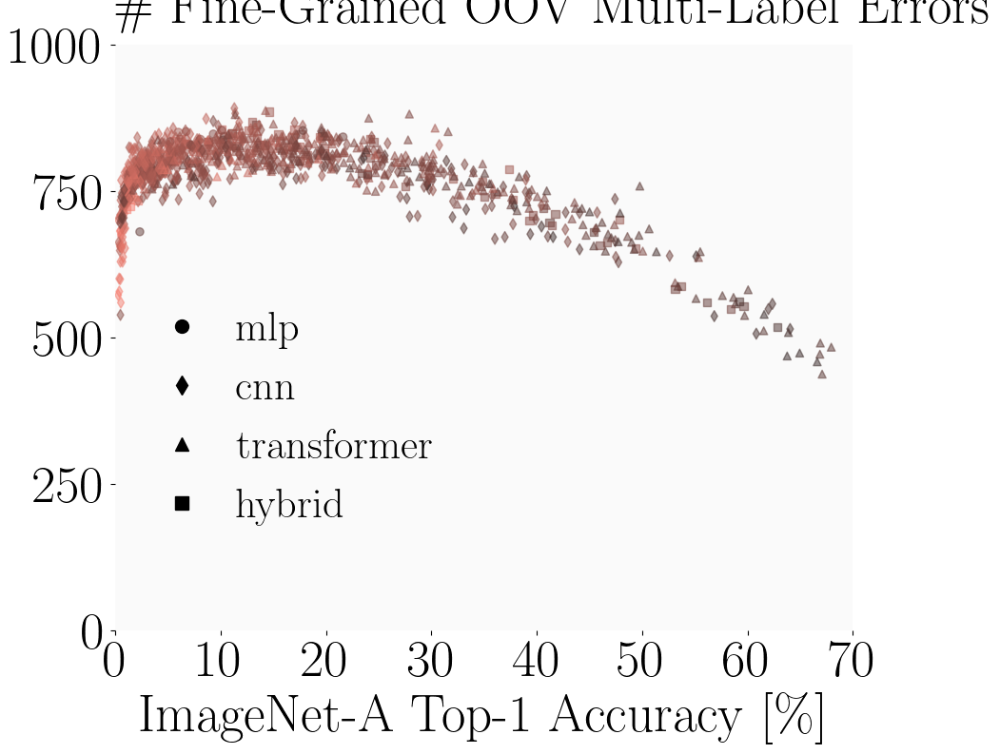

In [30]:
utils_plot.plot_fine_grained_OOV_imagenet_a(results_dfs, color_column='num_params')

# ===============

# Common co-occurrences (Spurious Correlations)

=== PER GROUP ===
Max ys: [1.51, 6.14]
Min ys: [0.02, 0.9]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_common_co_occ_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact


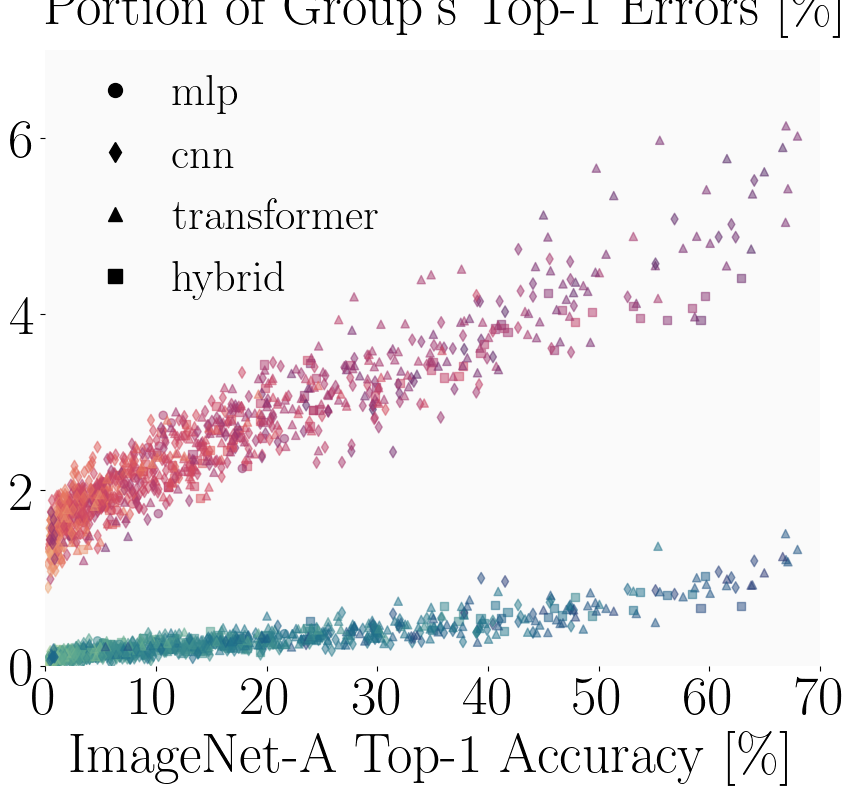

Max ys: [27, 72]
Min ys: [1, 20]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_common_co_occ_abs_marker=arch_family_color=num_params_groups=organism_artifact


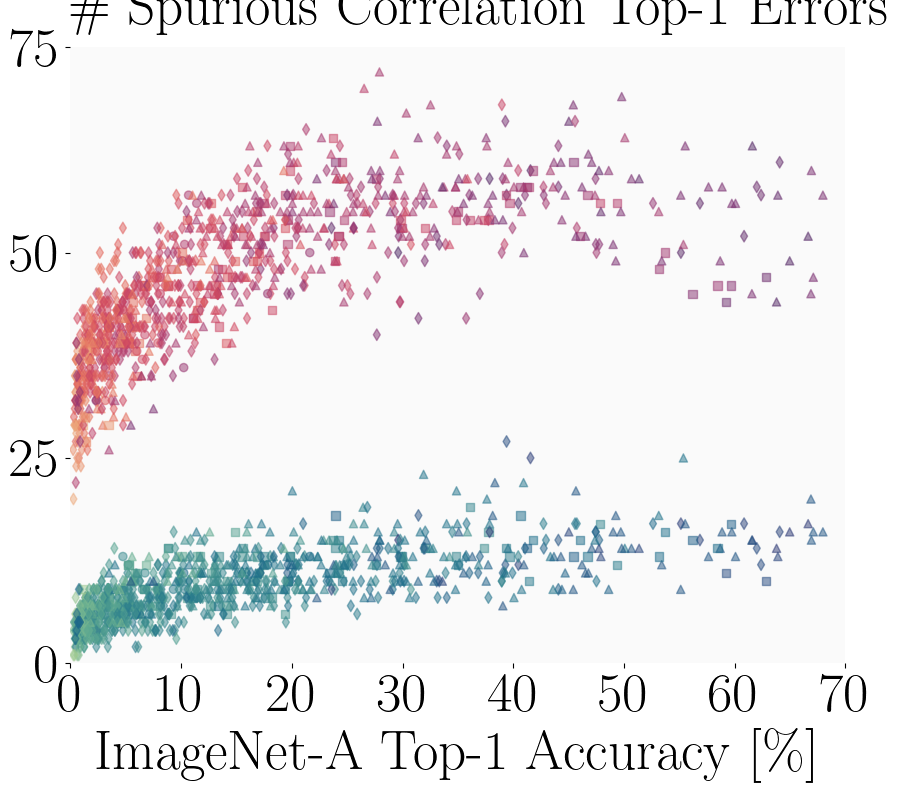

Max ys: [1.51, 6.14, 2.64]
Min ys: [0.02, 0.9, 0.0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_common_co_occ_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact_other


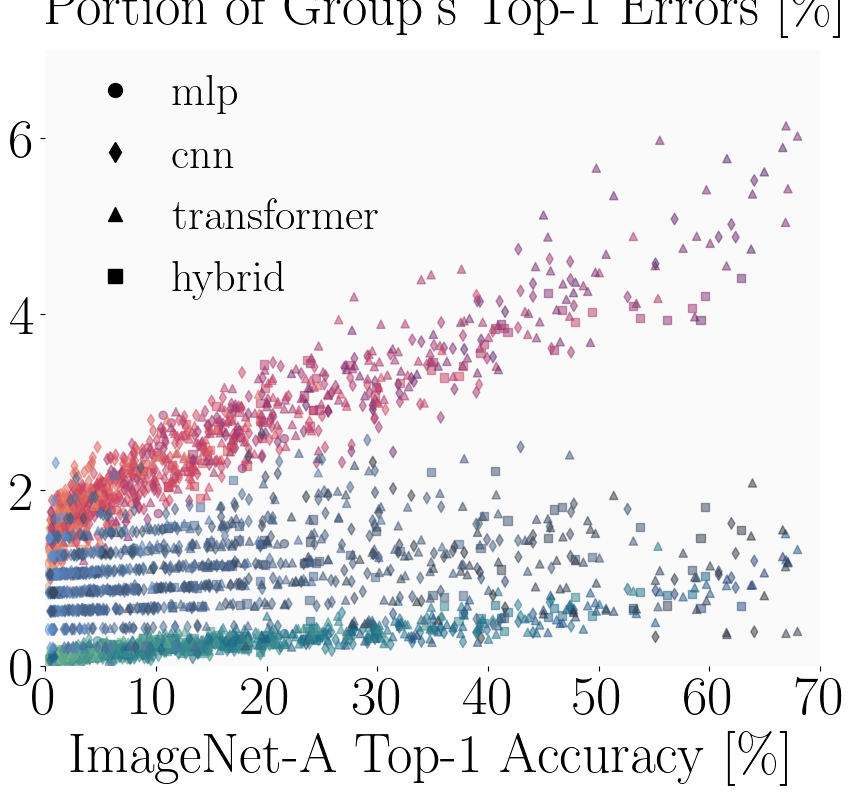

Max ys: [27, 72, 11]
Min ys: [1, 20, 0]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_common_co_occ_abs_marker=arch_family_color=num_params_groups=organism_artifact_other


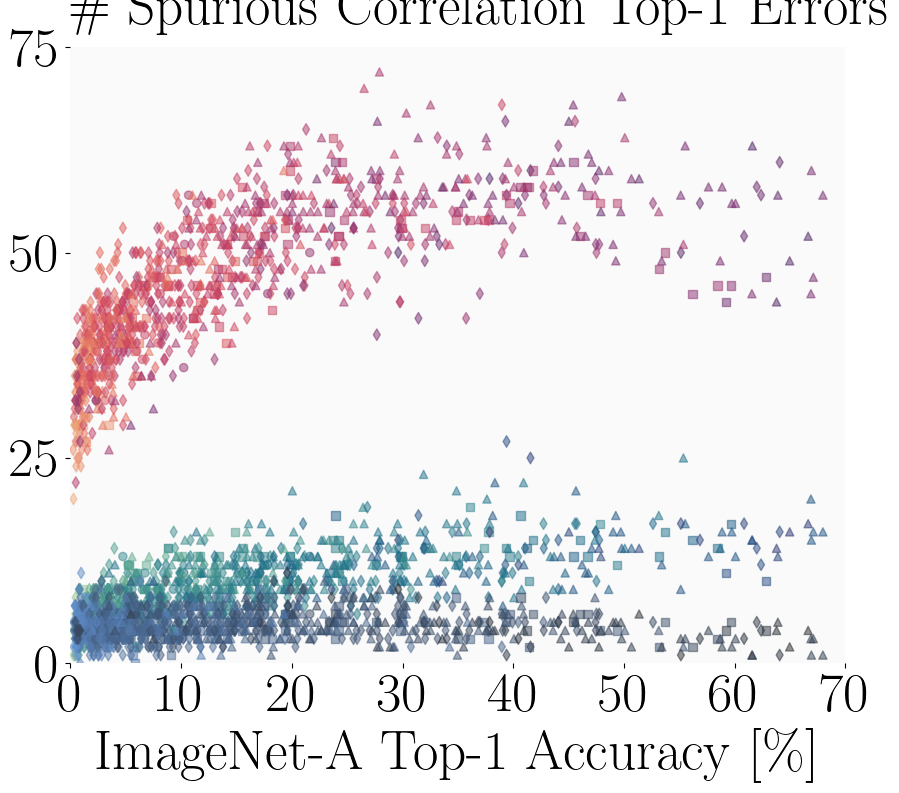

=== ALL ===
Max ys: [3.1]
Min ys: [0.31]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_common_co_occ_relative_to_group_mle_marker=arch_family_color=num_params_groups=all


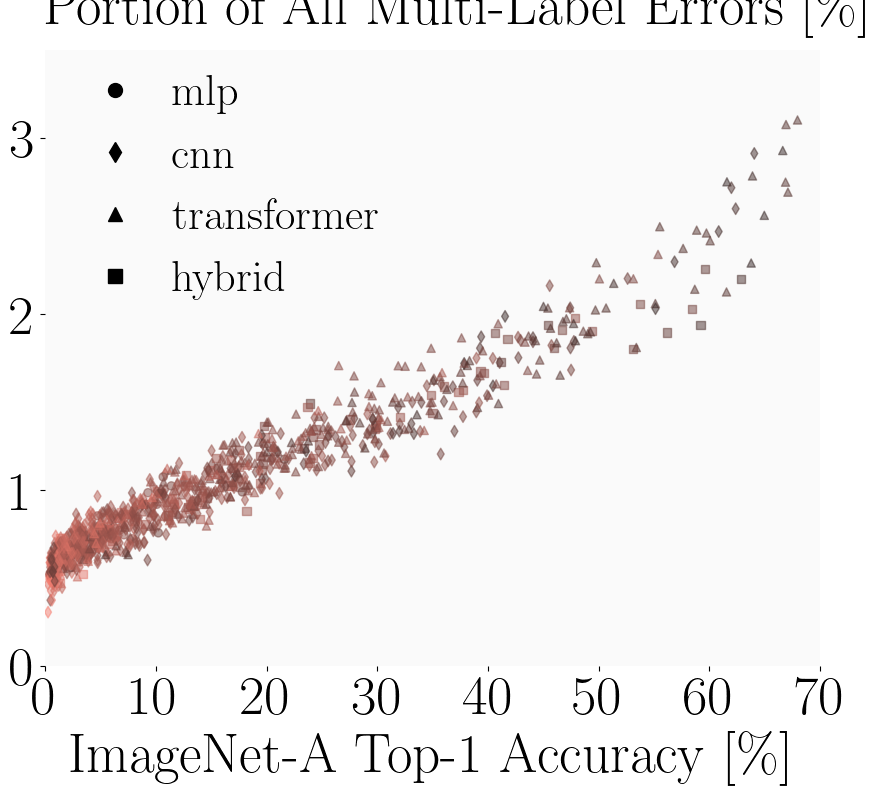

Max ys: [94]
Min ys: [23]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_common_co_occ_abs_marker=arch_family_color=num_params_groups=all


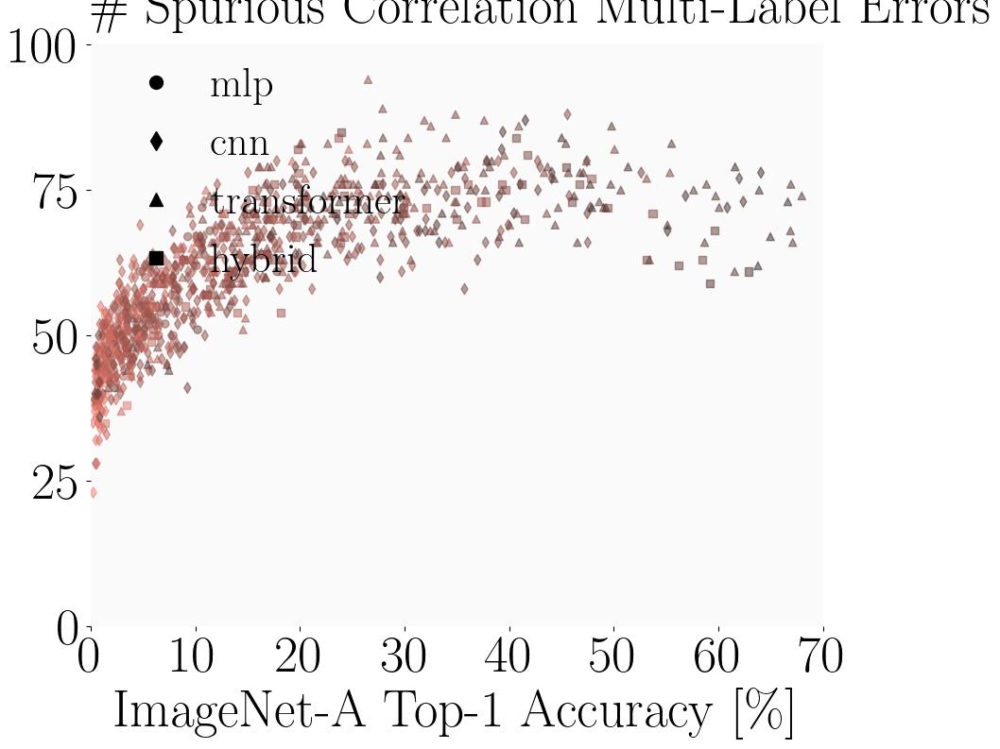

In [31]:
utils_plot.plot_common_co_occ_imagenet_a(results_dfs, color_column='num_params')

# ===============

# Model Failures (Major Errors)

=== PER GROUP ===
Max ys: [90.78, 83.18]
Min ys: [40.08, 52.75]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact


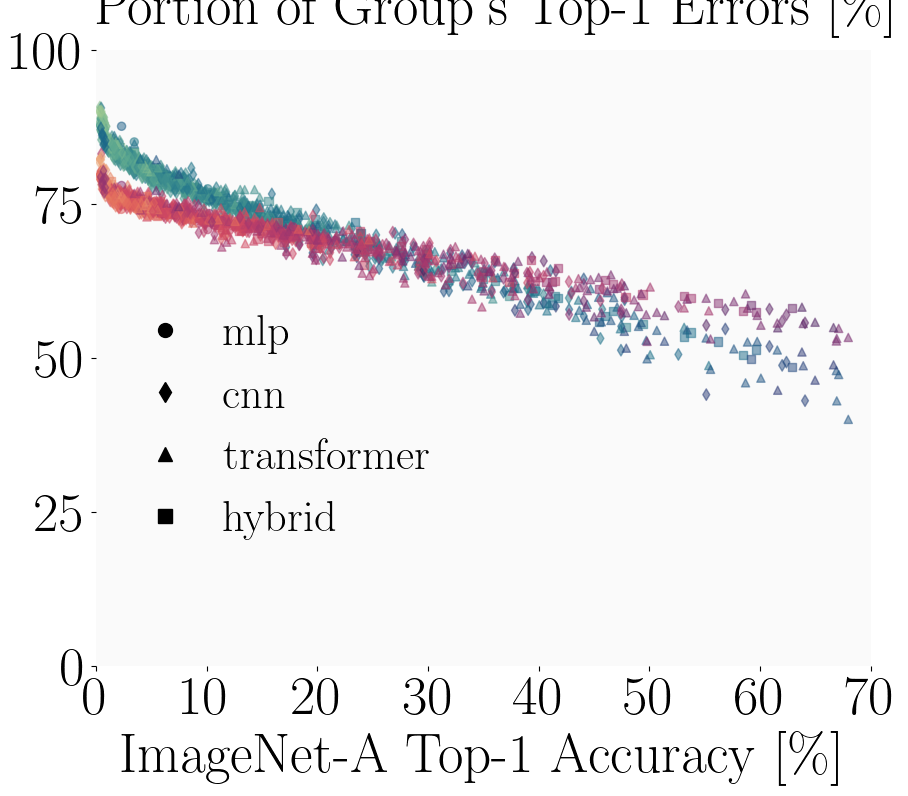

Max ys: [4330, 1845]
Min ys: [483, 471]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_abs_marker=arch_family_color=num_params_groups=organism_artifact


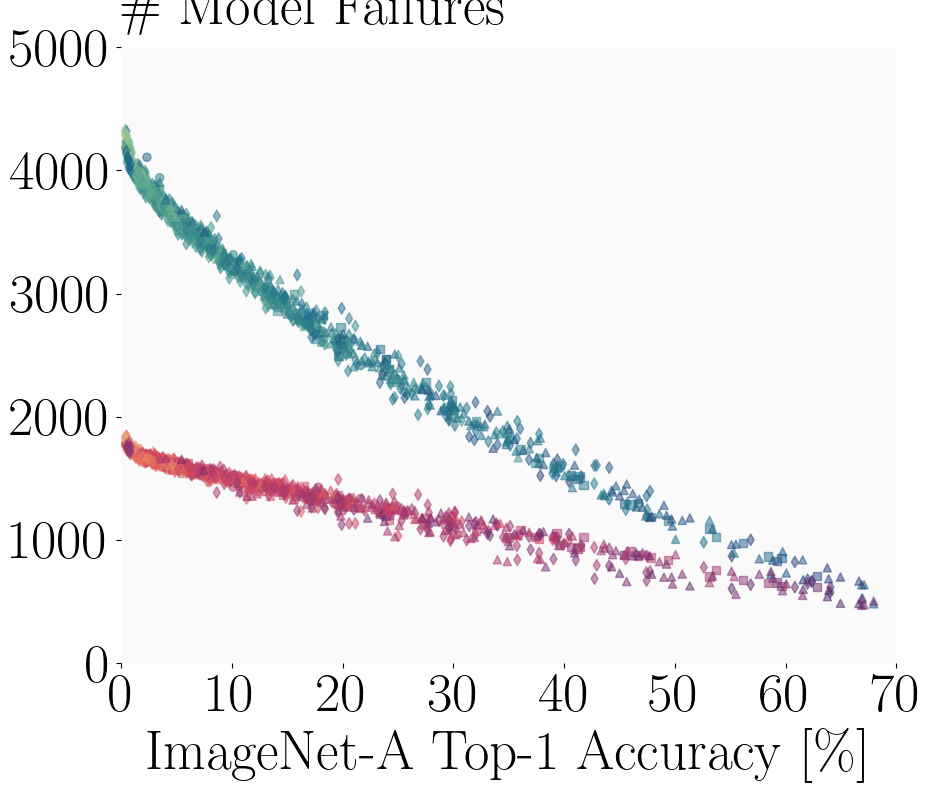

Max ys: [90.78, 83.18, 75.57]
Min ys: [40.08, 52.75, 35.66]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact_other


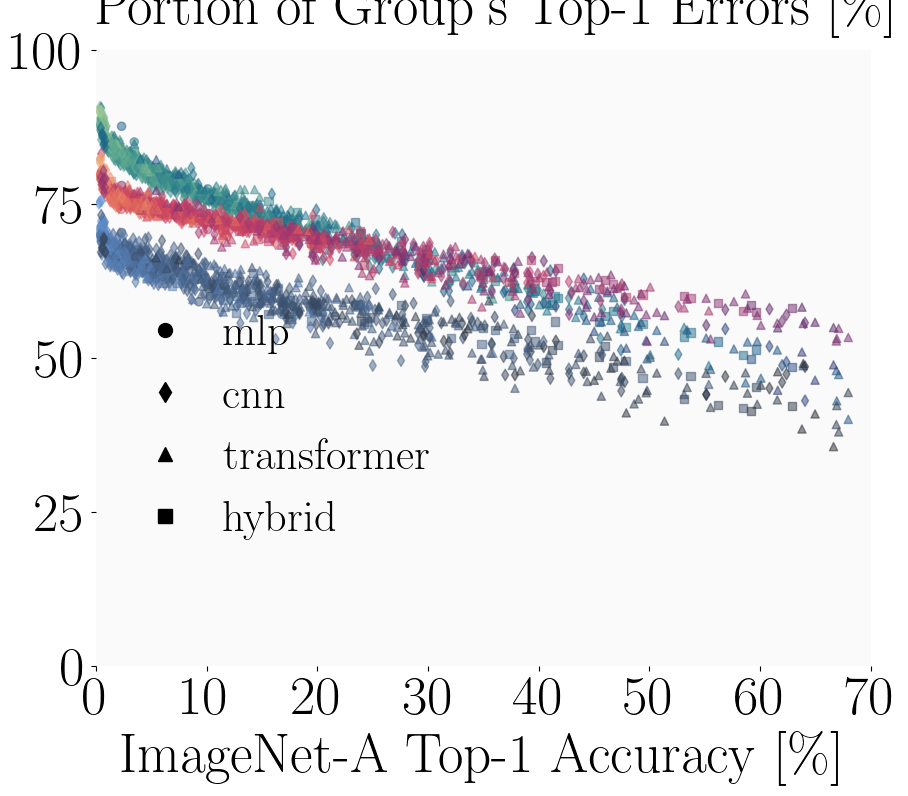

Max ys: [4330, 1845, 362]
Min ys: [483, 471, 92]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_abs_marker=arch_family_color=num_params_groups=organism_artifact_other


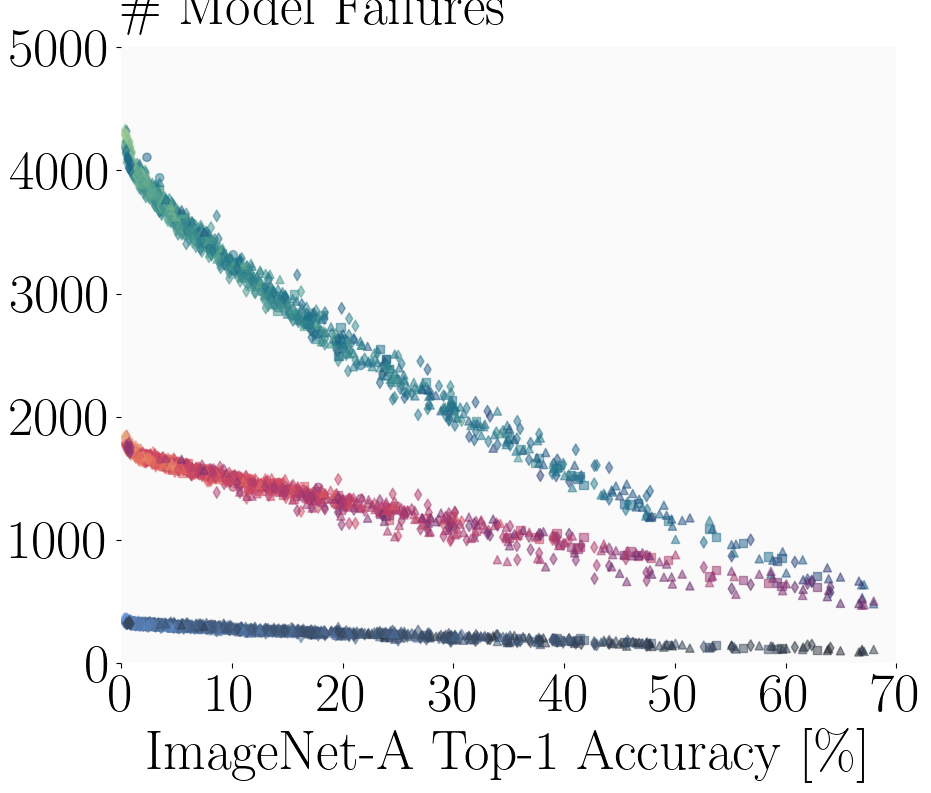

=== ALL ===
Max ys: [87.3]
Min ys: [45.78]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=all


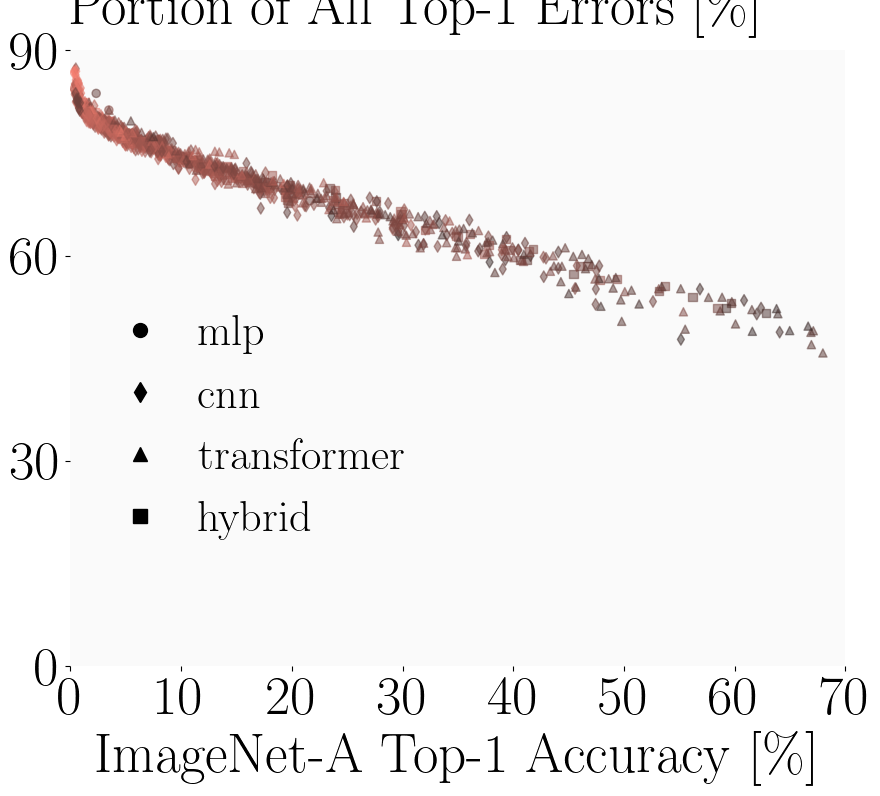

Max ys: [6516]
Min ys: [1100]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_abs_marker=arch_family_color=num_params_groups=all


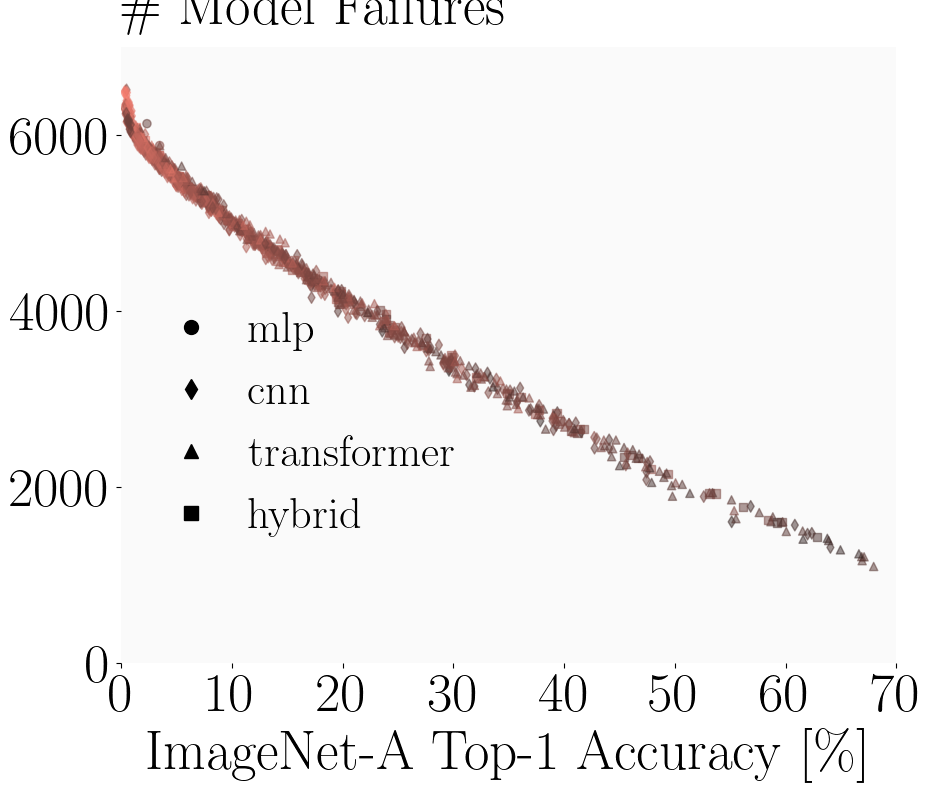

=== PER GROUP ===
Max ys: [90.78, 83.18]
Min ys: [40.08, 52.75]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact


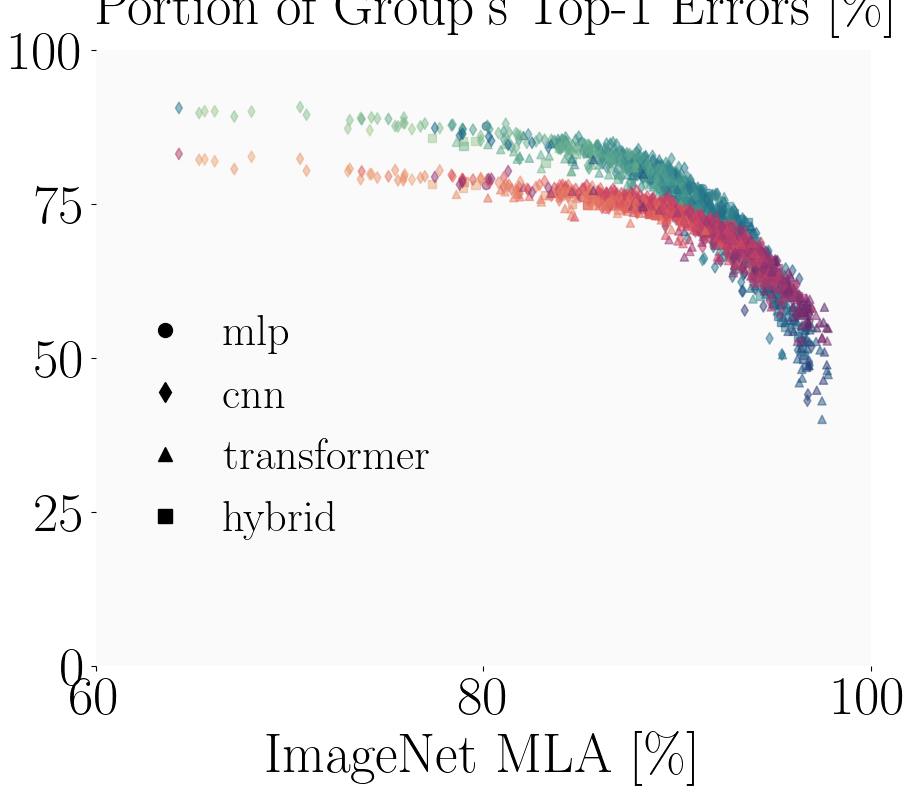

Max ys: [4330, 1845]
Min ys: [483, 471]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_abs_marker=arch_family_color=num_params_groups=organism_artifact


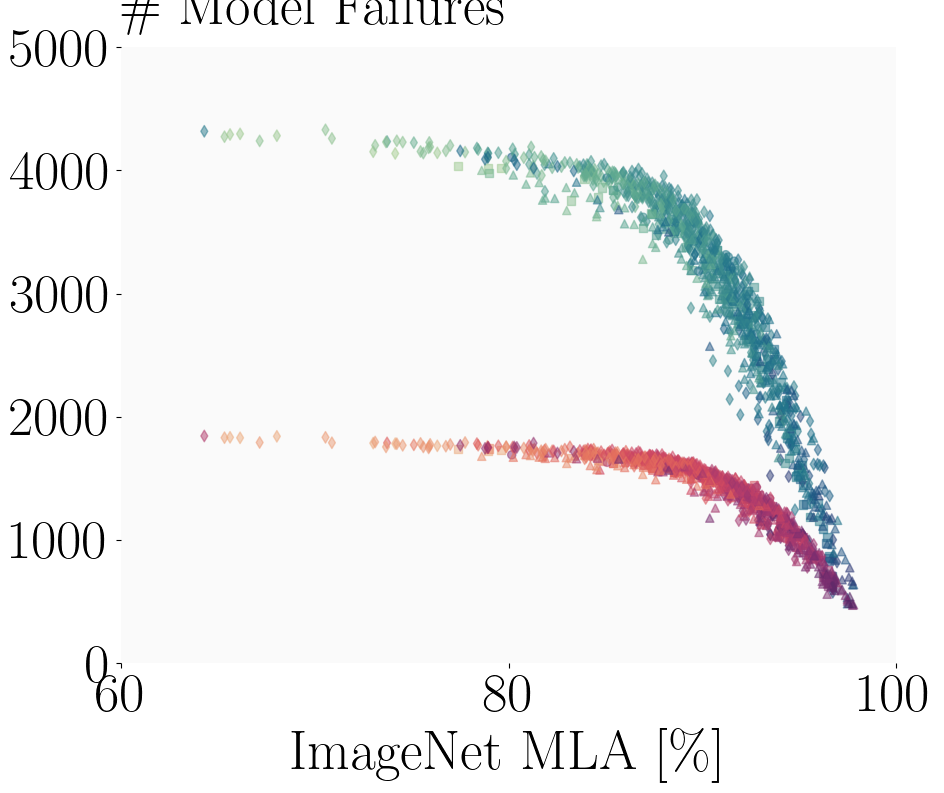

Max ys: [90.78, 83.18, 75.57]
Min ys: [40.08, 52.75, 35.66]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact_other


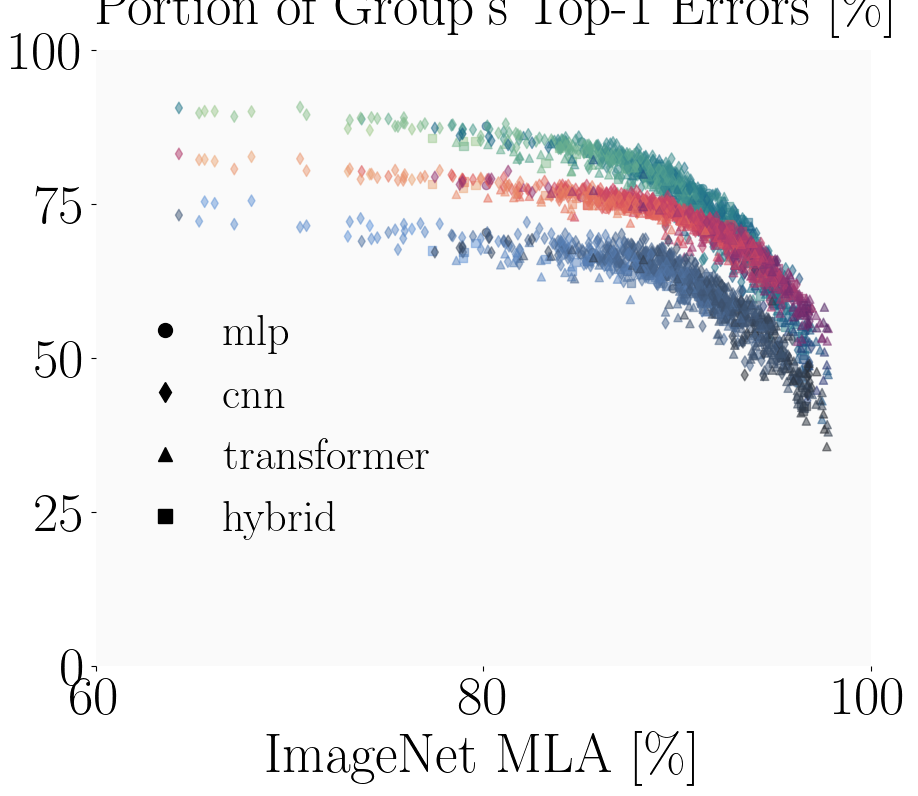

Max ys: [4330, 1845, 362]
Min ys: [483, 471, 92]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_abs_marker=arch_family_color=num_params_groups=organism_artifact_other


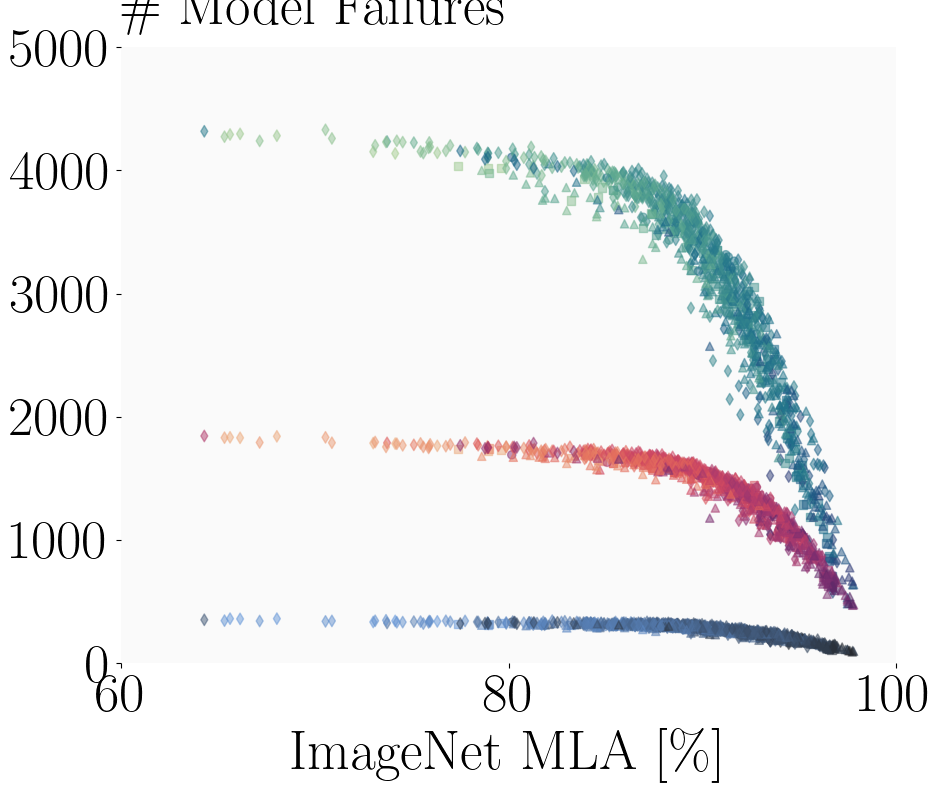

=== ALL ===
Max ys: [87.3]
Min ys: [45.78]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=all


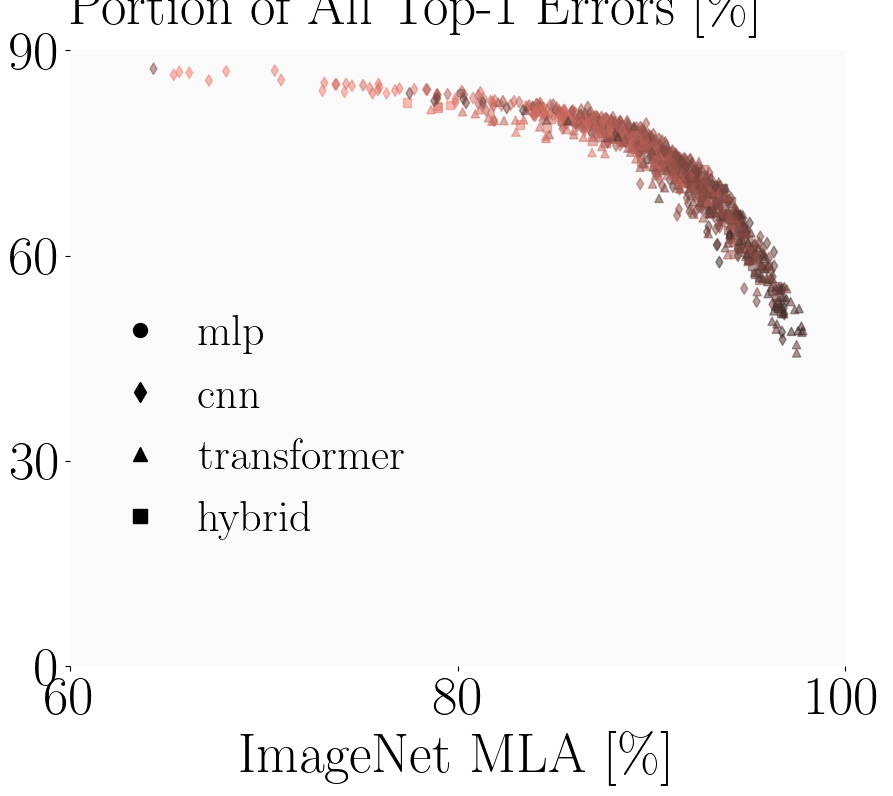

Max ys: [6516]
Min ys: [1100]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_abs_marker=arch_family_color=num_params_groups=all


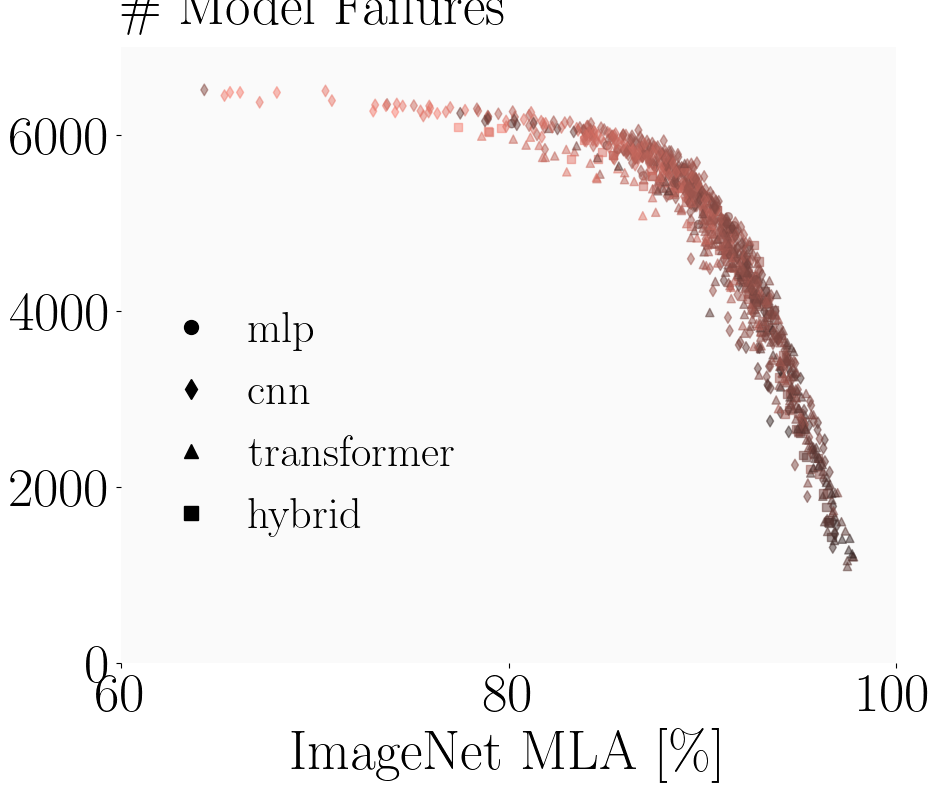

In [32]:
utils_plot.plot_model_failures_imagenet_a(results_dfs, color_column='num_params')
utils_plot.plot_model_failures_imagenet_a(results_dfs, base='imagenet', color_column='num_params')

# ===============

# Multi-Label Model Failures (MLF) / Multi-Label Errors (MLE) (per group and all)

=== PER GROUP ===
Max ys: [0.91, 0.83]
Min ys: [0.41, 0.53]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_group_mle_marker=arch_family_color=num_params_groups=organism_artifact


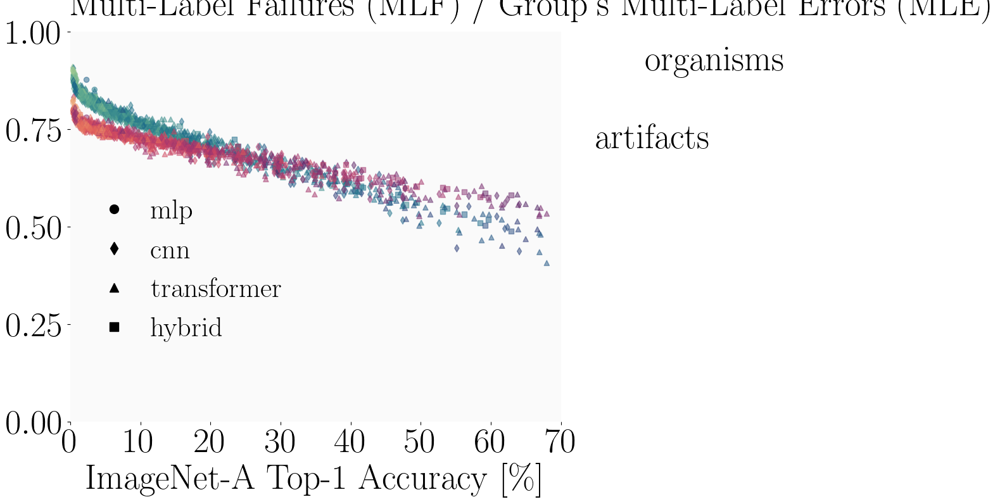

Max ys: [0.58, 0.25]
Min ys: [0.2, 0.16]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_all_mle_marker=arch_family_color=num_params_groups=organism_artifact


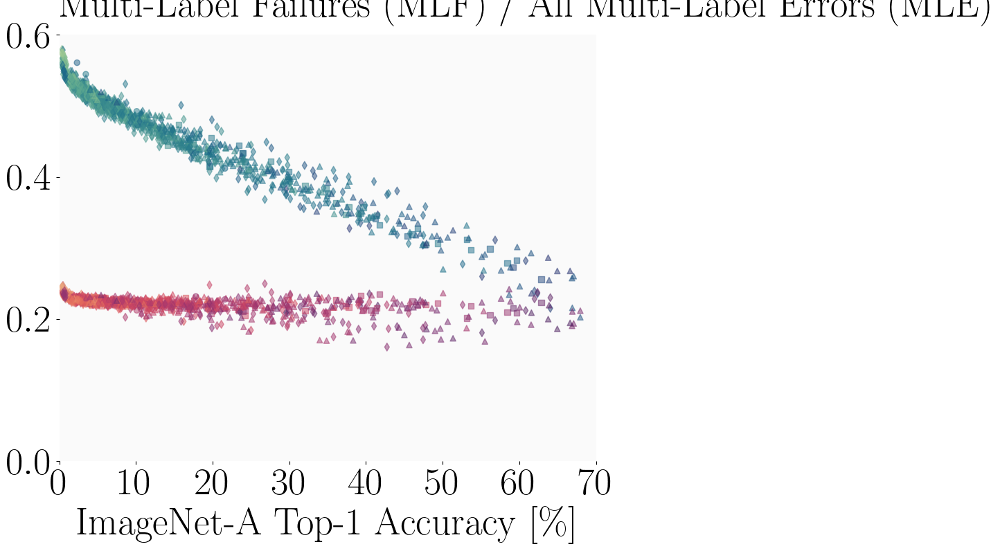

Max ys: [0.91, 0.83, 0.76]
Min ys: [0.41, 0.53, 0.36]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_group_mle_marker=arch_family_color=num_params_groups=organism_artifact_other


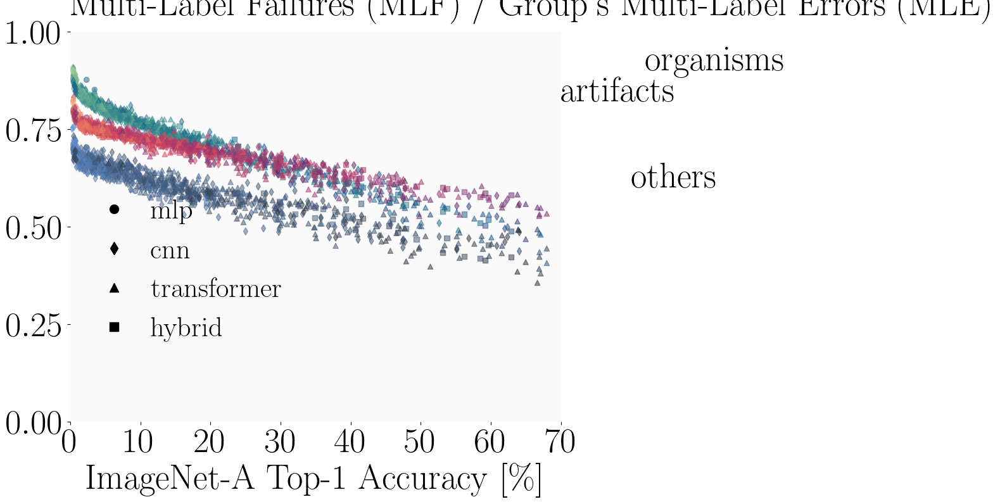

Max ys: [0.58, 0.25, 0.05]
Min ys: [0.2, 0.16, 0.03]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_all_mle_marker=arch_family_color=num_params_groups=organism_artifact_other


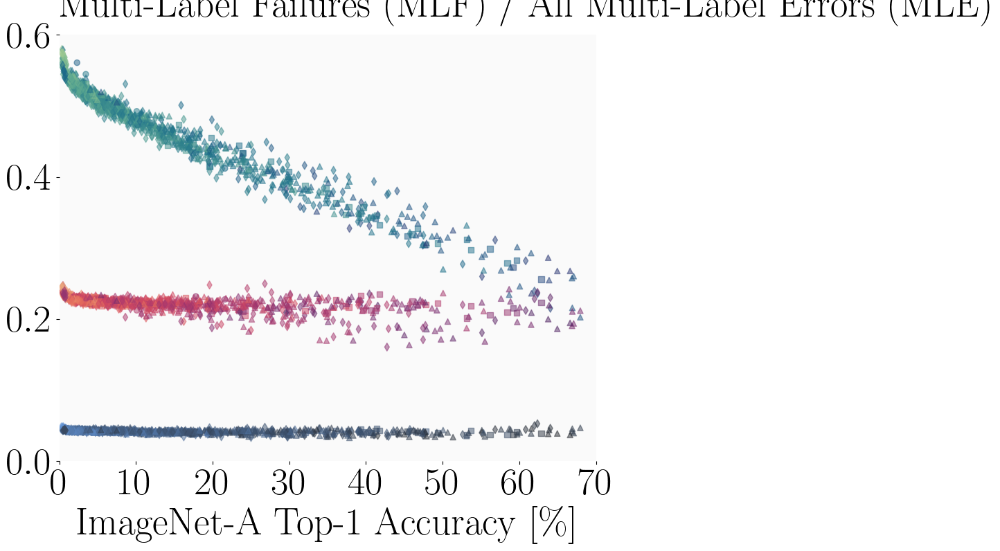

=== ALL ===
Max ys: [0.87]
Min ys: [0.46]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_all_mle_marker=arch_family_color=num_params_groups=all


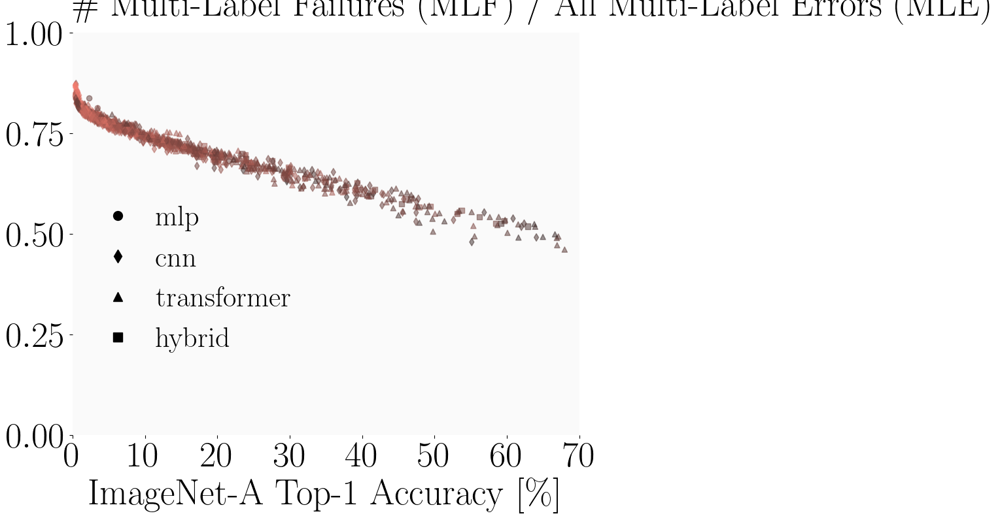

=== PER GROUP ===
Max ys: [0.91, 0.83]
Min ys: [0.41, 0.53]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_group_mle_marker=arch_family_color=num_params_groups=organism_artifact


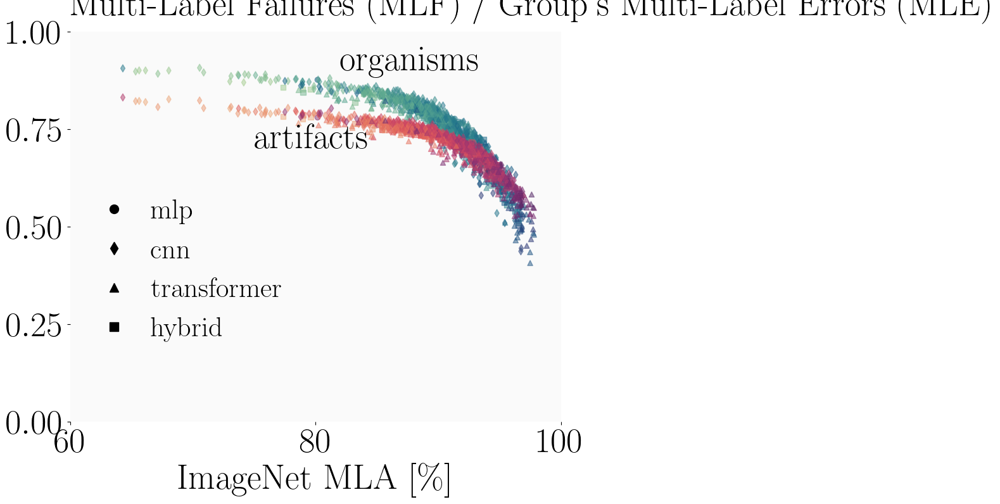

Max ys: [0.58, 0.25]
Min ys: [0.2, 0.16]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_all_mle_marker=arch_family_color=num_params_groups=organism_artifact


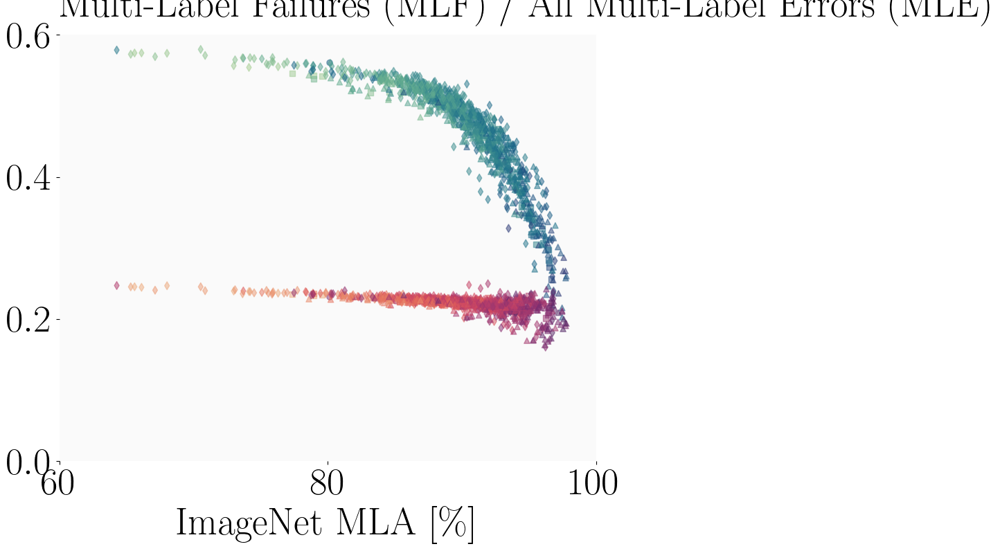

Max ys: [0.91, 0.83, 0.76]
Min ys: [0.41, 0.53, 0.36]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_group_mle_marker=arch_family_color=num_params_groups=organism_artifact_other


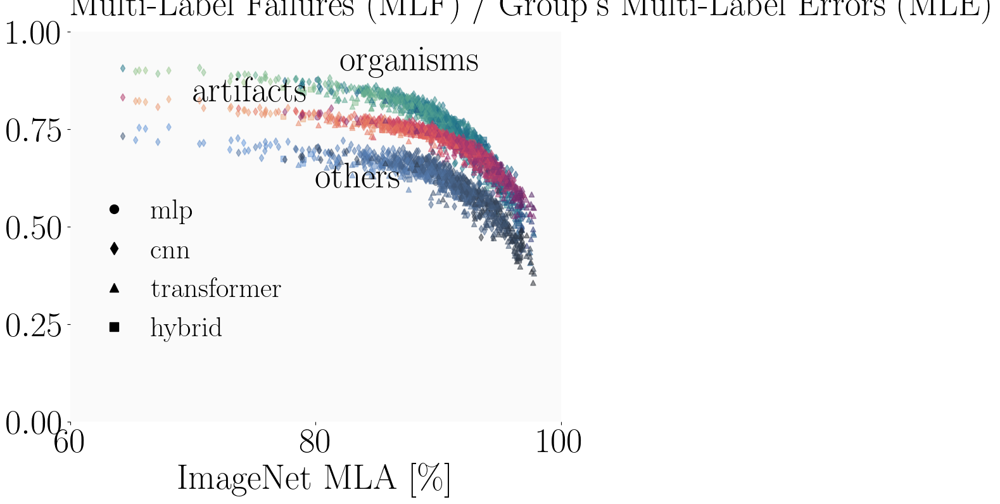

Max ys: [0.58, 0.25, 0.05]
Min ys: [0.2, 0.16, 0.03]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_all_mle_marker=arch_family_color=num_params_groups=organism_artifact_other


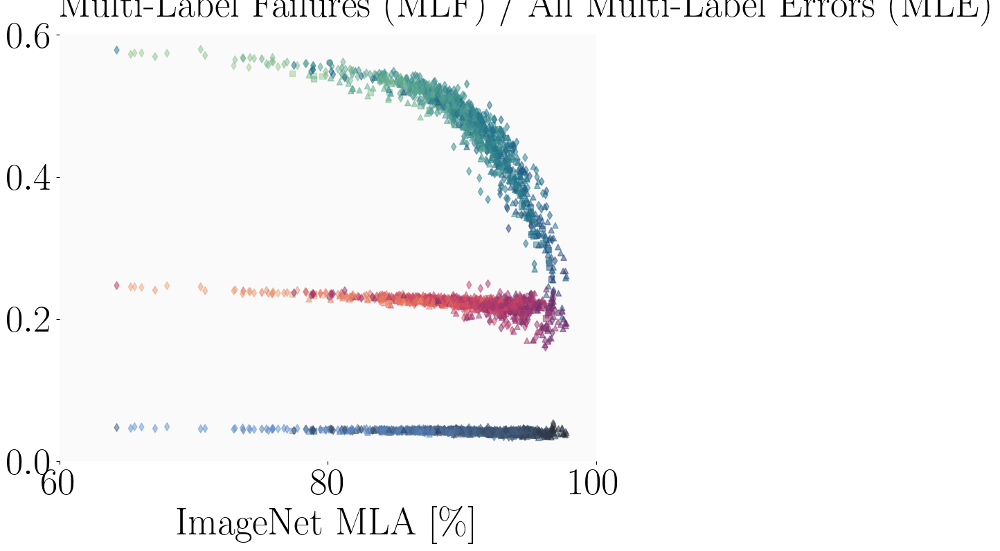

=== ALL ===
Max ys: [0.87]
Min ys: [0.46]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_all_mle_marker=arch_family_color=num_params_groups=all


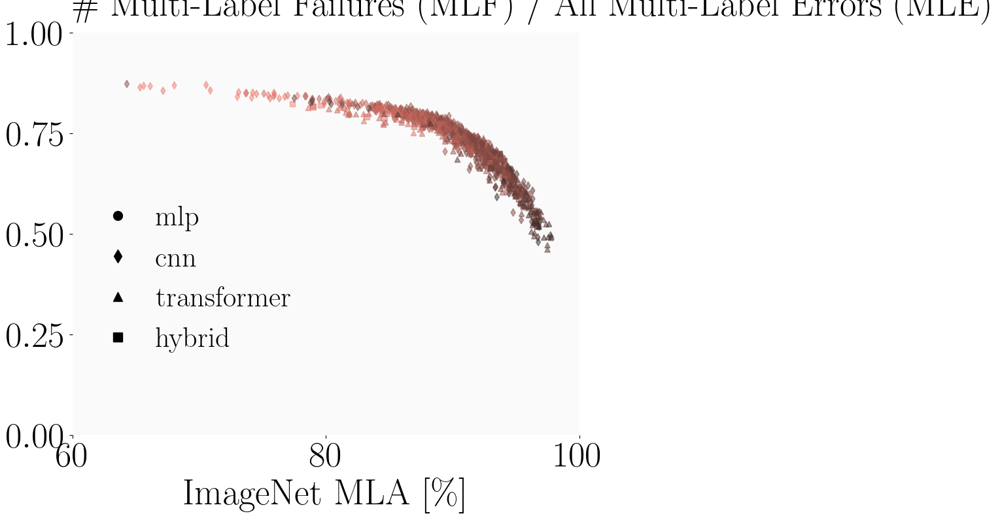

In [33]:
utils_plot.plot_model_failures_to_mle_imagenet_a(results_dfs, color_column='num_params')
utils_plot.plot_model_failures_to_mle_imagenet_a(results_dfs, base='imagenet', color_column='num_params')

# ===============

# Multi-Label Model Failures (MLF) / Top-1 Errors (per group and all)

=== PER GROUP ===
Max ys: [0.91, 0.83]
Min ys: [0.4, 0.53]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact


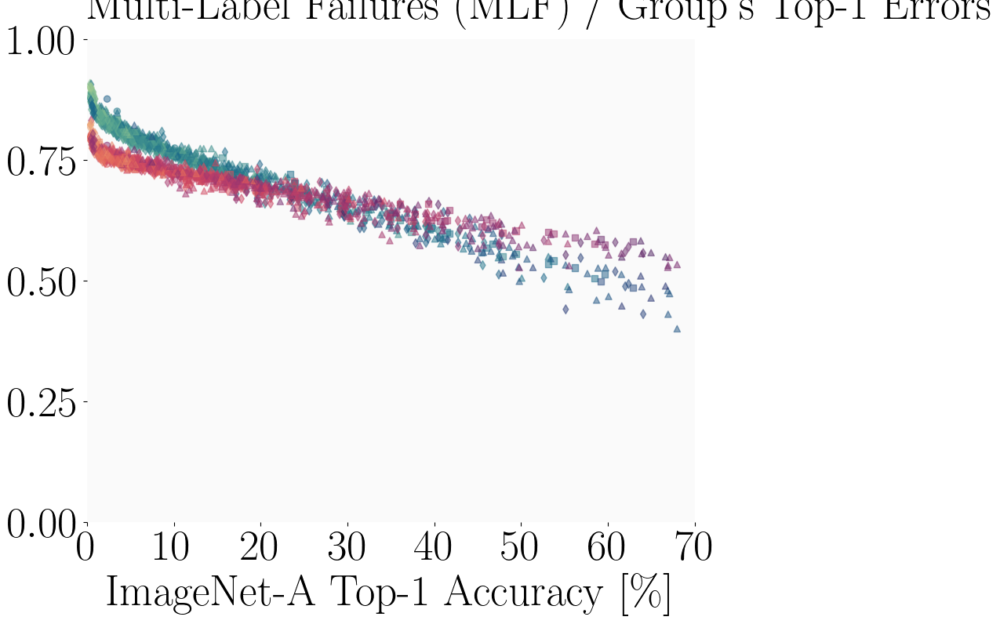

Max ys: [0.58, 0.25]
Min ys: [0.2, 0.16]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_all_top1_err_marker=arch_family_color=num_params_groups=organism_artifact


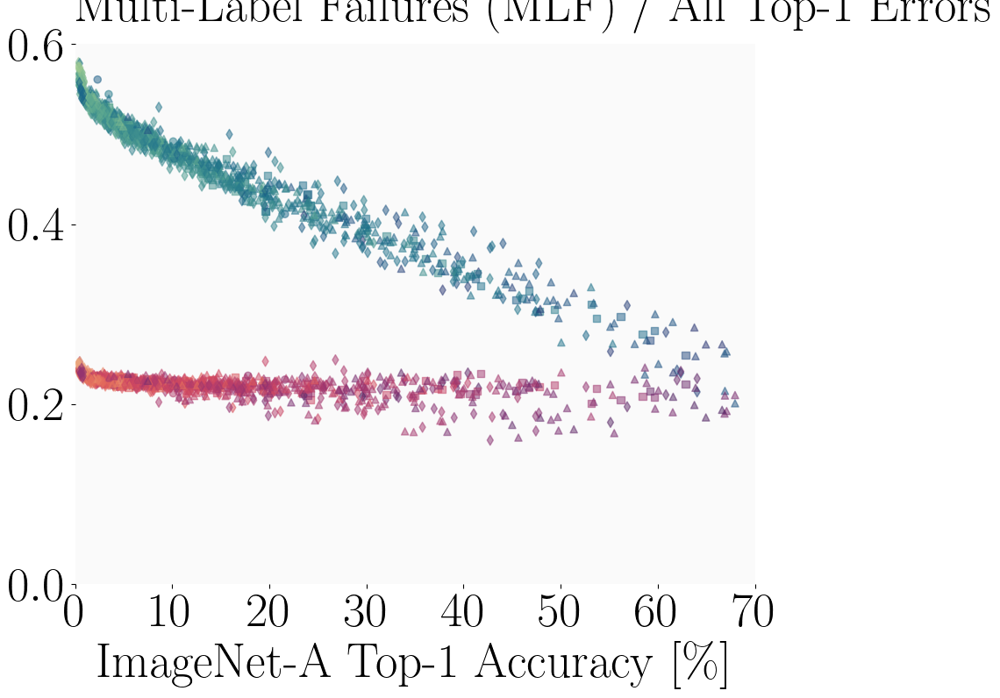

Max ys: [0.91, 0.83, 0.76]
Min ys: [0.4, 0.53, 0.36]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact_other


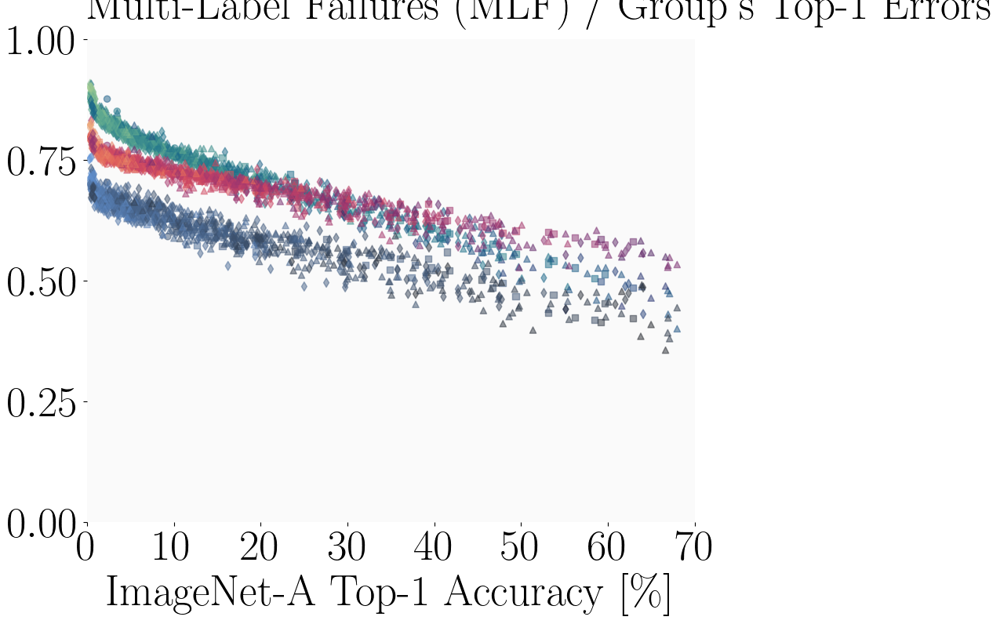

Max ys: [0.58, 0.25, 0.05]
Min ys: [0.2, 0.16, 0.03]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_all_top1_err_marker=arch_family_color=num_params_groups=organism_artifact_other


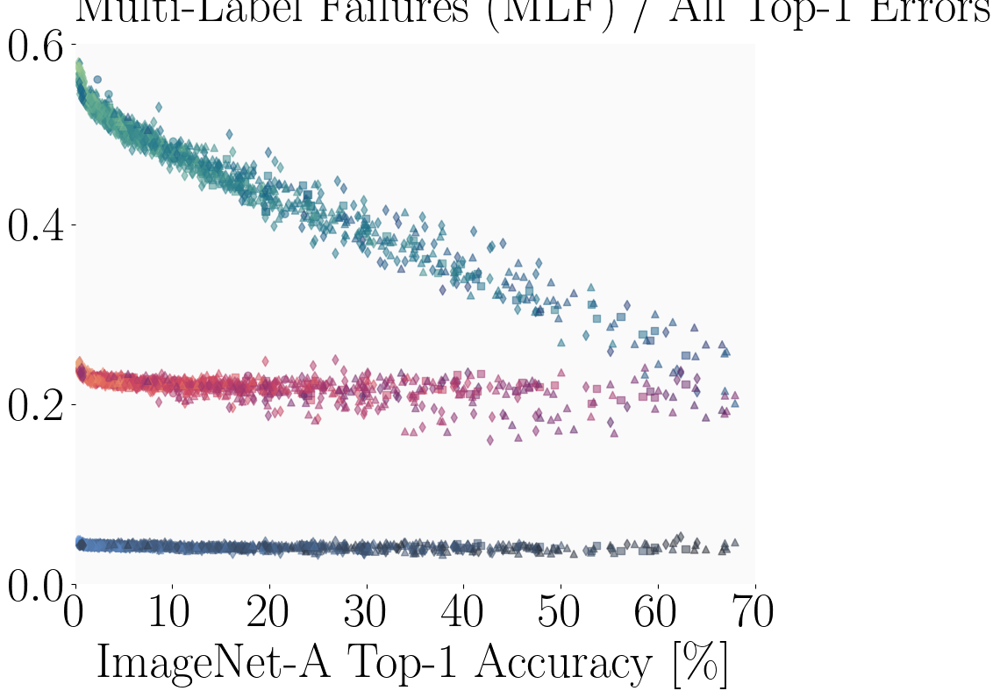

=== ALL ===
Max ys: [0.87]
Min ys: [0.46]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_a_top1_val_acc_y_axis=num_not_classified_relative_to_all_top1_err_marker=arch_family_color=num_params_groups=all


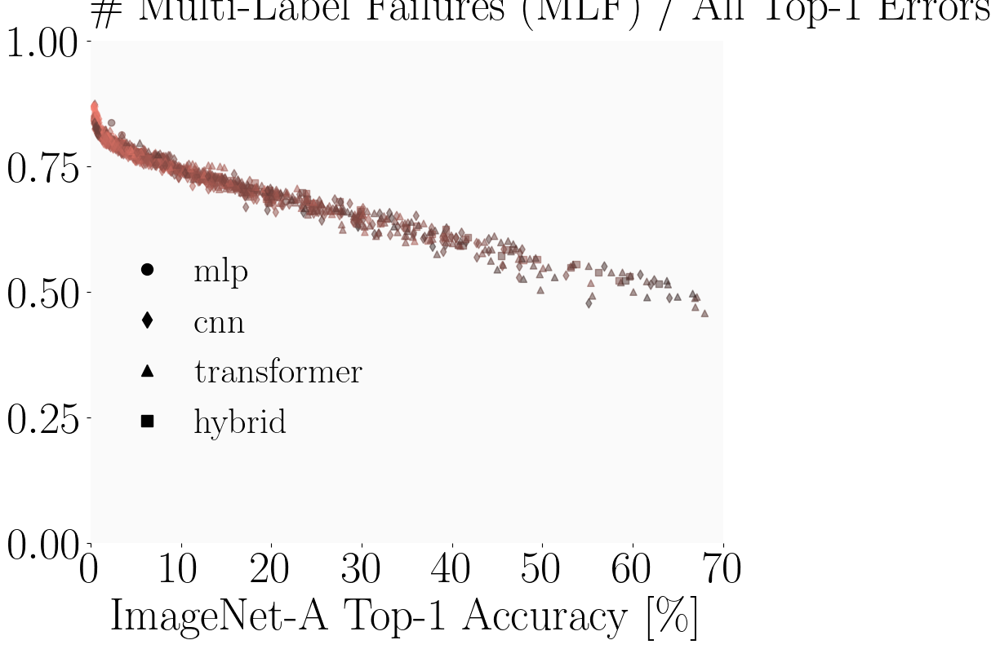

=== PER GROUP ===
Max ys: [0.91, 0.83]
Min ys: [0.4, 0.53]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact


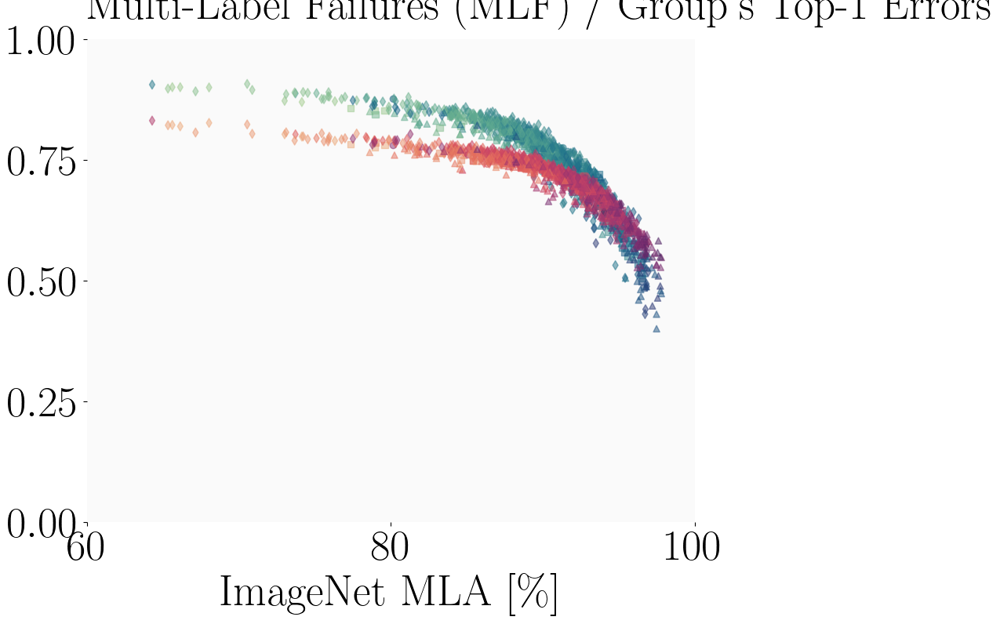

Max ys: [0.58, 0.25]
Min ys: [0.2, 0.16]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_all_top1_err_marker=arch_family_color=num_params_groups=organism_artifact


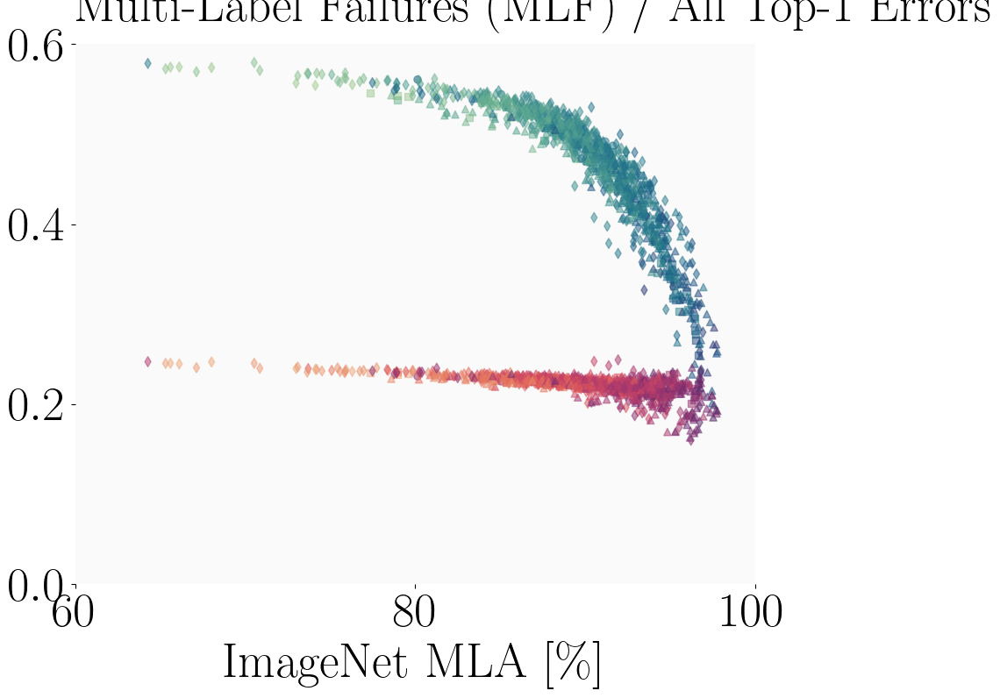

Max ys: [0.91, 0.83, 0.76]
Min ys: [0.4, 0.53, 0.36]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_group_top1_err_marker=arch_family_color=num_params_groups=organism_artifact_other


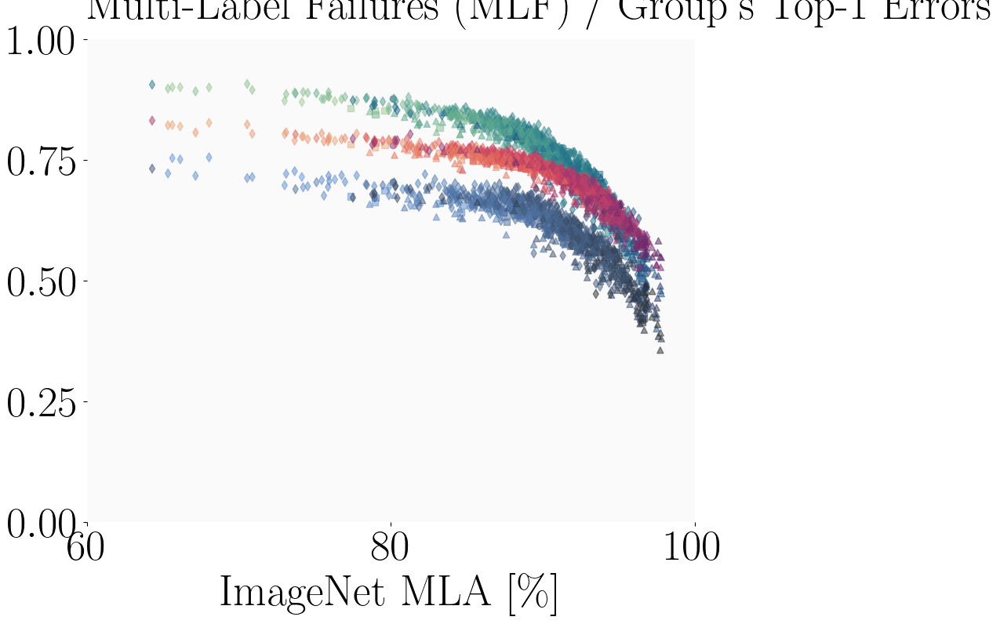

Max ys: [0.58, 0.25, 0.05]
Min ys: [0.2, 0.16, 0.03]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_all_top1_err_marker=arch_family_color=num_params_groups=organism_artifact_other


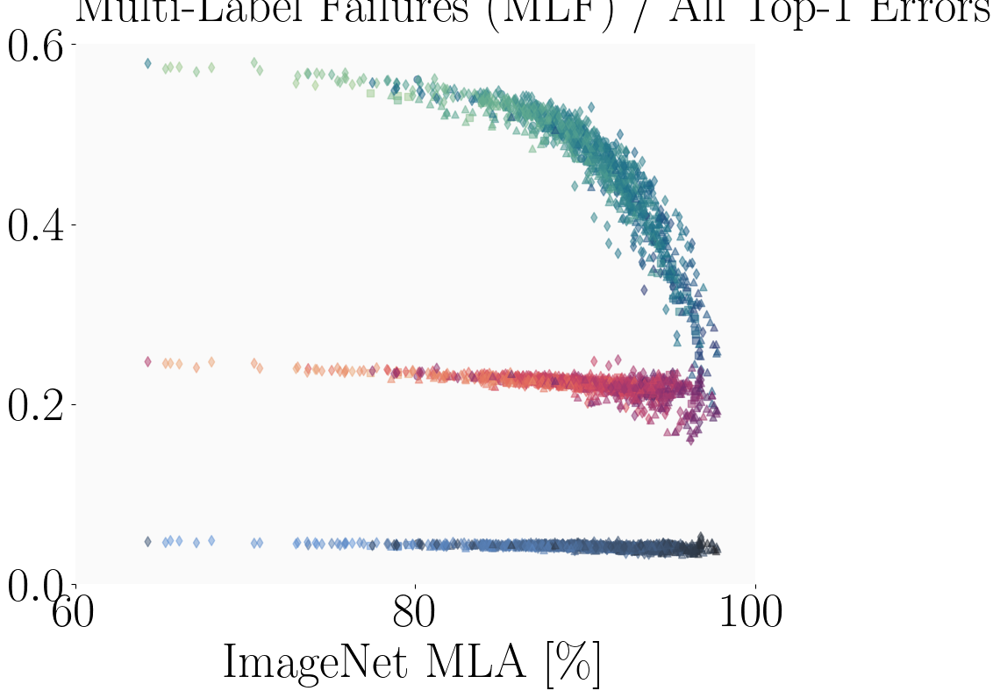

=== ALL ===
Max ys: [0.87]
Min ys: [0.46]
Figure file name: ../figures/imagenet-a/x_axis=imagenet_mla_val_acc_y_axis=num_not_classified_relative_to_all_top1_err_marker=arch_family_color=num_params_groups=all


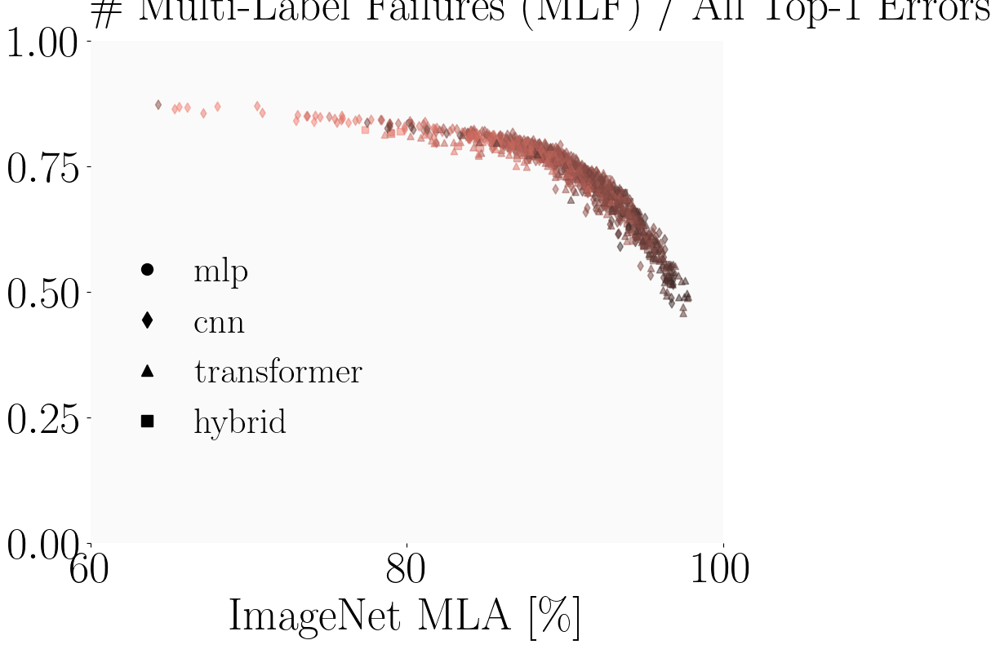

In [35]:
utils_plot.plot_model_failures_to_top1_err_imagenet_a(results_dfs, color_column='num_params')
utils_plot.plot_model_failures_to_top1_err_imagenet_a(results_dfs, base='imagenet', color_column='num_params')

# ===============